In [2]:
# ============================================================
# KSWGD Global Parameters (Shared by DMPS and Koopman SDMD)
# ============================================================

# Iteration settings
n_iter_kswgd = 10000           # Total gradient descent iterations (increased for slower convergence)
h_kswgd = 0.02                 # Step size / learning rate (CRITICAL: smaller = less collapse)
record_interval = 100          # Record metrics every N steps

# Particle initialization
n_init_particles = 2000        # Number of particles to initialize (more = better coverage)

# Spectral method settings
n_skip = 1                     # Skip first eigenvalue (stationary mode)
eig_threshold = 0.001          # Eigenvalue threshold (backup, not used when fixed modes)
c_epsilon = 0.5                # Kernel bandwidth coefficient for adaptive epsilon calculation

# Fixed mode counts (set to None to use eig_threshold instead)
k_modes_dm_fixed = 480          # Fixed number of DMPS modes (after skipping n_skip)
k_modes_sdmd_fixed = 250        # Fixed number of Koopman(SDMD) modes (after skipping n_skip)

# Random seed (set to None for non-deterministic results)
random_seed = 2             # Random seed for reproducibility (None = random)

print("="*60)
print("KSWGD GLOBAL PARAMETERS")
print("="*60)
print(f"Initial particles:     {n_init_particles}")
print(f"Eigenvalue threshold:  {eig_threshold}")
print(f"Kernel bandwidth coef: {c_epsilon}")
print(f"Random seed:           {random_seed if random_seed is not None else 'None (random)'}")
print("="*60)

KSWGD GLOBAL PARAMETERS
Initial particles:     2000
Eigenvalue threshold:  0.001
Kernel bandwidth coef: 0.5
Random seed:           2


# Quadruple-Well Potential System: SDMD + KSWGD

## Objective
1. Define 2D quadruple-well potential system V(x,y) = (x^2-1)^2 + (y^2-1)^2
2. Compute corresponding Boltzmann stationary distribution $\pi(x) \propto \exp(-V(x))$
3. Learn Langevin generator using SDMD
4. Use KSWGD to transport particles from outside wells into the four potential wells

## Theoretical Background
- Langevin dynamics: $dX = -\nabla V(X)dt + \sqrt{2}dW$
- Stationary distribution: $\pi(x) \propto \exp(-V(x))$
- Four potential wells located at $(\pm 1, \pm 1)$
- Goal: Learn generator from data, transport particles to stationary distribution

In [3]:
# Import required libraries
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
from scipy.linalg import svd, eig
import time
import torch
import subprocess

# Set random seed for reproducibility
np.random.seed(42)

# ============================================================
# GPU Setup: Select the most free GPU at the very beginning
# This ensures all subsequent cells use the same GPU consistently
# ============================================================
def get_most_free_gpu():
    """Query nvidia-smi to find the GPU with the lowest utilization."""
    try:
        result = subprocess.run(
            ['nvidia-smi', '--query-gpu=index,memory.used,memory.total,utilization.gpu', '--format=csv,noheader,nounits'],
            capture_output=True, text=True, check=True
        )
        lines = result.stdout.strip().split('\n')
        best_gpu = 0
        best_score = float('inf')
        print("GPU Status:")
        for line in lines:
            parts = [p.strip() for p in line.split(',')]
            idx = int(parts[0])
            mem_used = float(parts[1])
            mem_total = float(parts[2])
            util = float(parts[3])
            mem_usage_pct = 100 * mem_used / mem_total
            score = util + mem_usage_pct
            print(f"  GPU-{idx}: Util={util:.0f}%, Mem={mem_used:.0f}/{mem_total:.0f} MiB ({mem_usage_pct:.1f}%)")
            if score < best_score:
                best_score = score
                best_gpu = idx
        print(f">>> Selected GPU-{best_gpu}")
        return best_gpu
    except Exception as e:
        print(f"Warning: Could not query GPU: {e}, defaulting to GPU-0")
        return 0

# Setup GPU device - THIS IS THE SINGLE SOURCE OF TRUTH FOR GPU SELECTION
if torch.cuda.is_available():
    best_gpu_idx = get_most_free_gpu()
    device_compute = torch.device(f'cuda:{best_gpu_idx}')
    device = str(device_compute)  # String version for compatibility
    print(f"✓ Using GPU-{best_gpu_idx}: {torch.cuda.get_device_name(best_gpu_idx)}")
    print(f"  device_compute = {device_compute}")
    print(f"  device = '{device}'")
else:
    device_compute = torch.device('cpu')
    device = 'cpu'
    best_gpu_idx = -1
    print("⚠ GPU not available, using CPU")

print("\nLibraries imported successfully!")

GPU Status:
  GPU-0: Util=0%, Mem=4/24576 MiB (0.0%)
>>> Selected GPU-0
✓ Using GPU-0: NVIDIA GeForce RTX 3090
  device_compute = cuda:0
  device = 'cuda:0'

Libraries imported successfully!


## Define Four-Well Potential Function

We define a 2D four-well potential:
$$V(x, y) = (x^2 - 1)^2 + (y^2 - 1)^2$$

This potential has four local minima:
- Well 1: (x, y) $\approx$ (-1, -1)
- Well 2: (x, y) $\approx$ (1, -1)
- Well 3: (x, y) $\approx$ (-1, 1)
- Well 4: (x, y) $\approx$ (1, 1)
- Central saddle point: (0, 0)

In [4]:
class FourWellPotential:
    """
    2D Four-Well Potential System
    
    Potential function: V(x, y) = a*(x^2 - 1)^2 + b*(y^2 - 1)^2
    
    This creates four potential wells at approximately (\pm 1, \pm 1)
    
    Parameters:
        a: Controls double-well depth in x-direction (default 1.0)
        b: Controls double-well depth in y-direction (default 1.0)
        temperature: Temperature parameter (default 1.0), affects Boltzmann distribution width
    """
    
    def __init__(self, a=1.0, b=1.0, temperature=1.0):
        self.a = a
        self.b = b
        self.T = temperature  # Temperature (kT in units where k_B = 1)
        self._Z = None  # Partition function cache
        
    def V(self, x, y=None):
        """
        Compute potential energy
        
        Parameters:
            x: If y is None, x is array of shape (n, 2)
               Otherwise x is x-coordinate, y is y-coordinate
        Returns:
            Potential energy value(s)
        """
        if y is None:
            # x is (n, 2) array
            x_coord = x[:, 0] if x.ndim > 1 else x[0]
            y_coord = x[:, 1] if x.ndim > 1 else x[1]
        else:
            x_coord = x
            y_coord = y
            
        return self.a * (x_coord**2 - 1)**2 + self.b * (y_coord**2 - 1)**2
    
    def grad_V(self, X):
        """
        Compute potential gradient \nabla V(x, y)
        
        Parameters:
            X: Array of shape (n, 2), each row is a point (x, y)
        Returns:
            Gradient array of shape (n, 2)
        """
        x = X[:, 0]
        y = X[:, 1]
        
        # \partial V / \partial x = 4*a*x*(x^2 - 1)
        dV_dx = 4 * self.a * x * (x**2 - 1)
        
        # \partial V / \partial y = 4*b*y*(y^2 - 1)
        dV_dy = 4 * self.b * y * (y**2 - 1)
        
        return np.stack([dV_dx, dV_dy], axis=1)
    
    def stationary_density(self, x, y=None, x_range=(-3, 3), y_range=(-3, 3), n_grid=500):
        """
        Compute normalized Boltzmann stationary distribution \pi(x) = exp(-V(x)/T) / Z
        
        Parameters:
            x, y: Coordinates (can be scalar, array, or grid)
            x_range, y_range: Range for numerical integration to compute Z
            n_grid: Grid size for numerical integration
            
        Returns:
            Normalized density values
        """
        # Compute unnormalized density
        V_val = self.V(x, y)
        unnormalized_density = np.exp(-V_val / self.T)
        
        # Compute partition function Z if not cached
        if self._Z is None:
            x_int = np.linspace(x_range[0], x_range[1], n_grid)
            y_int = np.linspace(y_range[0], y_range[1], n_grid)
            dx = (x_range[1] - x_range[0]) / n_grid
            dy = (y_range[1] - y_range[0]) / n_grid
            X_int, Y_int = np.meshgrid(x_int, y_int)
            V_int = self.V(X_int, Y_int)
            self._Z = np.sum(np.exp(-V_int / self.T)) * dx * dy
        
        return unnormalized_density / self._Z

# Create four-well system instance
potential = FourWellPotential(a=1.0, b=1.0, temperature=1)

print("Four-well potential system created!")
print(f"Parameters: a={potential.a}, b={potential.b}, T={potential.T}")
print(f"Energy minima locations: (+/-1, +/-1)")
print(f"Minimum energy value: V(1, 1) = {potential.V(np.array([[1.0, 1.0]]))[0]:.4f}")
print(f"Saddle point value: V(0, 0) = {potential.V(np.array([[0.0, 0.0]]))[0]:.4f}")

Four-well potential system created!
Parameters: a=1.0, b=1.0, T=1
Energy minima locations: (+/-1, +/-1)
Minimum energy value: V(1, 1) = 0.0000
Saddle point value: V(0, 0) = 2.0000


## Visualize Potential Landscape and Stationary Distribution

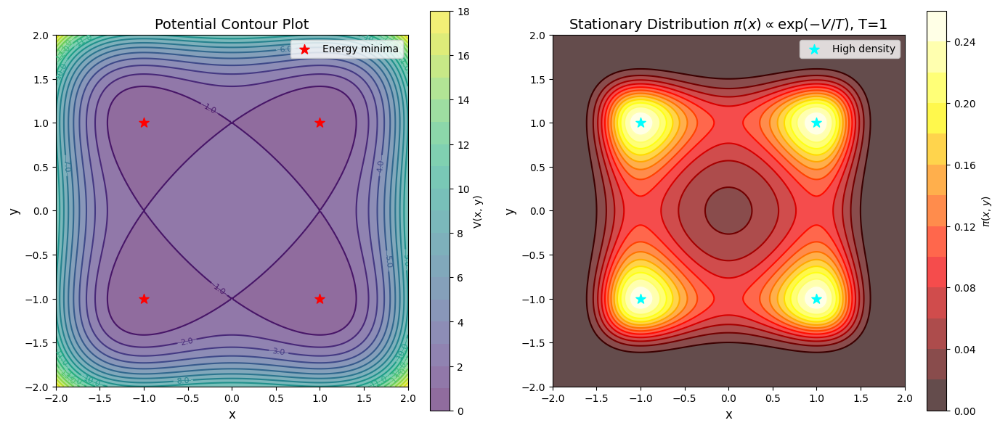


Potential Analysis:
Energy minima: V(+/-1, +/-1) = 0.0000
Central saddle: V(0, 0) = 2.0000
Side saddles: V(+/-1, 0) = 1.0000
Energy difference: DeltaV = 2.0000
Temperature parameter: T = 1

Stationary distribution concentrates around four energy minima!


In [5]:
# Create grid for visualization
x_range = np.linspace(-2, 2, 200)
y_range = np.linspace(-2, 2, 200)
X_grid, Y_grid = np.meshgrid(x_range, y_range)

# Compute potential and density
V_grid = potential.V(X_grid, Y_grid)
density_grid = potential.stationary_density(X_grid, Y_grid)

# Create figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# ========== Subplot 1: Potential Contour Plot ==========
ax1 = axes[0]
contour = ax1.contour(X_grid, Y_grid, V_grid, levels=20, cmap='viridis', linewidths=1.5)
contourf = ax1.contourf(X_grid, Y_grid, V_grid, levels=20, cmap='viridis', alpha=0.6)
ax1.clabel(contour, inline=True, fontsize=8, fmt='%.1f')
ax1.scatter([-1, -1, 1, 1], [-1, 1, -1, 1], color='red', s=100, marker='*', 
           label='Energy minima', zorder=10)
ax1.set_xlabel('x', fontsize=12)
ax1.set_ylabel('y', fontsize=12)
ax1.set_title('Potential Contour Plot', fontsize=14)
ax1.set_xlim(-2, 2)
ax1.set_ylim(-2, 2)
ax1.set_aspect('equal')
ax1.legend(loc='upper right')
fig.colorbar(contourf, ax=ax1, label='V(x, y)')

# ========== Subplot 2: Boltzmann Stationary Distribution ==========
ax2 = axes[1]
contour_density = ax2.contour(X_grid, Y_grid, density_grid, levels=15, 
                              cmap='hot', linewidths=1.5)
contourf_density = ax2.contourf(X_grid, Y_grid, density_grid, levels=15, 
                                cmap='hot', alpha=0.7)
ax2.scatter([-1, -1, 1, 1], [-1, 1, -1, 1], color='cyan', s=100, marker='*', 
           label='High density', zorder=10)
ax2.set_xlabel('x', fontsize=12)
ax2.set_ylabel('y', fontsize=12)
ax2.set_title(f'Stationary Distribution $\\pi(x) \\propto \\exp(-V/T)$, T={potential.T}', 
             fontsize=14)
ax2.set_xlim(-2, 2)
ax2.set_ylim(-2, 2)
ax2.set_aspect('equal')
ax2.legend(loc='upper right')
fig.colorbar(contourf_density, ax=ax2, label='$\\pi(x, y)$')

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("Potential Analysis:")
print("="*60)
print(f"Energy minima: V(+/-1, +/-1) = {potential.V(np.array([[1.0, 1.0]]))[0]:.4f}")
print(f"Central saddle: V(0, 0) = {potential.V(np.array([[0.0, 0.0]]))[0]:.4f}")
print(f"Side saddles: V(+/-1, 0) = {potential.V(np.array([[1.0, 0.0]]))[0]:.4f}")
print(f"Energy difference: DeltaV = {potential.V(np.array([[0.0, 0.0]]))[0] - potential.V(np.array([[1.0, 1.0]]))[0]:.4f}")
print(f"Temperature parameter: T = {potential.T}")
print(f"\nStationary distribution concentrates around four energy minima!")
print("="*60)

## Verify Stationary Distribution Normalization

Check that the stationary distribution is properly normalized ($\int \pi(x) dx = 1$)

In [6]:
# Verify normalization of stationary distribution
# Numerically integrate pi(x) over the entire domain

# Use a fine grid for accurate integration
x_int = np.linspace(-3, 3, 300)
y_int = np.linspace(-3, 3, 300)
X_int, Y_int = np.meshgrid(x_int, y_int)
dx = x_int[1] - x_int[0]
dy = y_int[1] - y_int[0]

# Compute density on integration grid
density_int = potential.stationary_density(X_int, Y_int)

# Numerical integration using trapezoidal rule
integral = np.sum(density_int) * dx * dy

print("="*60)
print("Normalization Verification:")
print("="*60)
print(f"Numerical integral of pi(x) over domain: {integral:.6f}")
print(f"Expected value: 1.0")
print(f"Relative error: {abs(integral - 1.0):.2e}")
print("="*60)

if abs(integral - 1.0) < 0.01:
    print("Check: Distribution is properly normalized!")
else:
    print("Warning: Distribution normalization may be inaccurate")
    print("  (This could be due to finite integration domain)")
print("="*60)

Normalization Verification:
Numerical integral of pi(x) over domain: 1.004012
Expected value: 1.0
Relative error: 4.01e-03
Check: Distribution is properly normalized!


## Generate Training Data: (X_tar, X_tar_next)

Sample X_tar from stationary distribution $\pi(x)$, then evolve to X_tar_next using Langevin dynamics:
$$dX = -\nabla V(X)dt + \sqrt{2}dW$$

In [7]:
# ============================================================
# Step 1: Generate Time Series Trajectory using Langevin Dynamics
# ============================================================

def generate_langevin_trajectory(potential, n_samples=2500, dt=0.1, n_substeps=10, burnin=1000):
    """
    Generate a single long trajectory from Langevin dynamics
    
    SDE: dX = -âˆ‡V(X)dt + âˆš(2)dW
    
    Parameters:
        potential: FourWellPotential instance
        n_samples: Number of trajectory points to generate
        dt: Time step between saved points
        n_substeps: Number of sub-steps for numerical stability per dt
        burnin: Number of initial steps to discard (thermalization)
    
    Returns:
        trajectory: Array of shape (n_samples, 2) - consecutive time series points
    """
    # Initialize at a random position
    X_curr = np.random.randn(2) * 0.5
    
    trajectory = []
    n_total = burnin + n_samples
    dt_sub = dt / n_substeps
    
    print(f"Generating Langevin trajectory:")
    print(f"  - Total time steps: {n_total}")
    print(f"  - Burnin steps: {burnin}")
    print(f"  - Trajectory length: {n_samples}")
    print(f"  - dt = {dt}, sub-steps = {n_substeps}, dt_sub = {dt_sub:.6f}")
    
    for i in range(n_total):
        # Evolve for one time step (with n_substeps)
        for _ in range(n_substeps):
            # Drift term: -âˆ‡V(X)
            grad_V = potential.grad_V(X_curr.reshape(1, -1))
            drift = -grad_V[0]
            
            # Diffusion term: âˆš(2 * dt_sub) * Gaussian noise
            noise = np.sqrt(2.0 * dt_sub) * np.random.randn(2)
            
            # Euler-Maruyama update
            X_curr = X_curr + drift * dt_sub + noise
        
        # Store trajectory point after burnin
        if i >= burnin:
            trajectory.append(X_curr.copy())
        
        # Progress indicator
        if (i + 1) % 500 == 0:
            print(f"  Progress: {i+1}/{n_total} steps", end='\r')
    
    print(f"\n  Trajectory generation complete!")
    return np.array(trajectory)

# Generate trajectory data
n_samples = 10000
dt = 0.01  # Time step between consecutive points
n_substeps = 10  # Numerical stability
burnin = 1000  # Thermalization period

print("="*60)
print("Generating X_tar as a time series trajectory...")
print("="*60)
X_tar = generate_langevin_trajectory(potential, n_samples=n_samples, dt=dt, 
                                     n_substeps=n_substeps, burnin=burnin)
print(f"\nX_tar shape: {X_tar.shape}")
print(f"X_tar range: x âˆˆ [{X_tar[:, 0].min():.2f}, {X_tar[:, 0].max():.2f}], "
      f"y âˆˆ [{X_tar[:, 1].min():.2f}, {X_tar[:, 1].max():.2f}]")
print(f"\nâœ“ Data type: CONSECUTIVE TIME SERIES (not i.i.d. samples)")
print(f"  X_tar[i] â†’ X_tar[i+1] are temporally correlated")
print("="*60)

Generating X_tar as a time series trajectory...
Generating Langevin trajectory:
  - Total time steps: 11000
  - Burnin steps: 1000
  - Trajectory length: 10000
  - dt = 0.01, sub-steps = 10, dt_sub = 0.001000
  Progress: 11000/11000 steps
  Trajectory generation complete!

X_tar shape: (10000, 2)
X_tar range: x âˆˆ [-1.74, 1.78], y âˆˆ [-1.81, 1.81]

âœ“ Data type: CONSECUTIVE TIME SERIES (not i.i.d. samples)
  X_tar[i] â†’ X_tar[i+1] are temporally correlated


In [8]:
# ============================================================
# Step 2: Create X_tar_next from consecutive trajectory points
# ============================================================

print("="*60)
print("Creating training pairs (X_tar, X_tar_next) from trajectory...")
print("="*60)
print(f"Method: Consecutive time series points")
print(f"  X_tar[i] at time t_i")
print(f"  X_tar_next[i] at time t_(i+1) = t_i + dt")

# Simply shift the trajectory by one time step
X_tar_next = X_tar[1:].copy()  # Points from t=1 to t=2500
X_tar = X_tar[:-1].copy()      # Points from t=0 to t=2499

print(f"\nX_tar shape: {X_tar.shape}")
print(f"X_tar_next shape: {X_tar_next.shape}")
print(f"\nTraining pairs: {X_tar.shape[0]}")
print(f"Time lag: dt = {dt}")
print(f"\nâœ“ Each pair (X_tar[i], X_tar_next[i]) represents:")
print(f"  one step evolution under Langevin dynamics")
print("="*60)

Creating training pairs (X_tar, X_tar_next) from trajectory...
Method: Consecutive time series points
  X_tar[i] at time t_i
  X_tar_next[i] at time t_(i+1) = t_i + dt

X_tar shape: (9999, 2)
X_tar_next shape: (9999, 2)

Training pairs: 9999
Time lag: dt = 0.01

âœ“ Each pair (X_tar[i], X_tar_next[i]) represents:
  one step evolution under Langevin dynamics


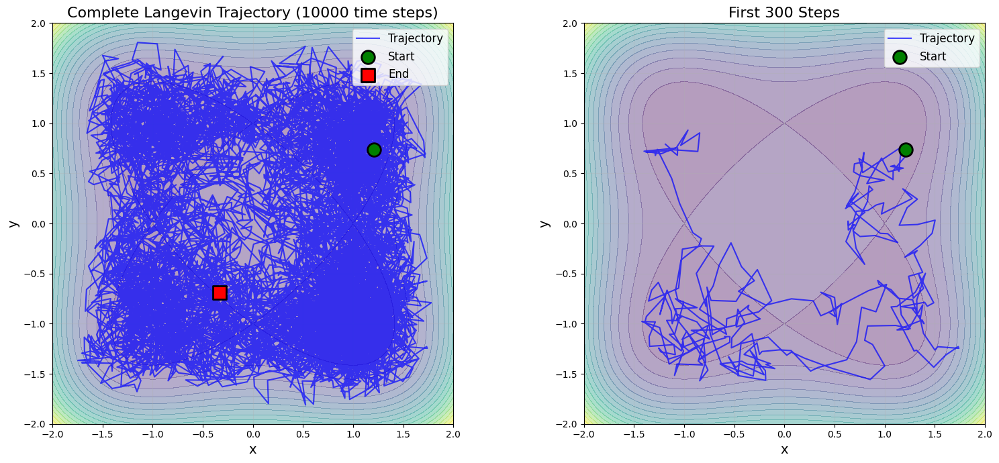


Time Series Trajectory
Total trajectory length: 10000 time steps
Time interval: dt = 0.01
Total simulation time: 100.0 time units


In [9]:
# ============================================================
# Visualize Time Series Trajectory
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# ========== Subplot 1: Complete Trajectory ==========
ax1 = axes[0]

# Plot potential contour as background
contourf1 = ax1.contourf(X_grid, Y_grid, V_grid, levels=20, cmap='viridis', alpha=0.4)

# Plot the trajectory as a simple blue line
ax1.plot(X_tar[:, 0], X_tar[:, 1], 'b-', linewidth=1.5, alpha=0.7, label='Trajectory')

# Mark start and end points
ax1.scatter(X_tar[0, 0], X_tar[0, 1], c='green', s=200, marker='o', 
           edgecolors='black', linewidth=2, label='Start', zorder=10)
ax1.scatter(X_tar[-1, 0], X_tar[-1, 1], c='red', s=200, marker='s', 
           edgecolors='black', linewidth=2, label='End', zorder=10)

ax1.set_xlabel('x', fontsize=14)
ax1.set_ylabel('y', fontsize=14)
ax1.set_title(f'Complete Langevin Trajectory ({len(X_tar)+1} time steps)', fontsize=16)
ax1.set_xlim(-2, 2)
ax1.set_ylim(-2, 2)
ax1.set_aspect('equal')
ax1.legend(loc='upper right', fontsize=12)
ax1.grid(True, alpha=0.3)

# ========== Subplot 2: First 300 Steps ==========
ax2 = axes[1]
n_zoom = min(300, len(X_tar))

# Plot potential contour as background
contourf2 = ax2.contourf(X_grid, Y_grid, V_grid, levels=20, cmap='viridis', alpha=0.4)

# Plot the trajectory as a simple blue line (first 300 steps)
ax2.plot(X_tar[:n_zoom, 0], X_tar[:n_zoom, 1], 'b-', linewidth=1.5, alpha=0.7, label='Trajectory')

# Mark start point only
ax2.scatter(X_tar[0, 0], X_tar[0, 1], c='green', s=200, marker='o', 
           edgecolors='black', linewidth=2, label='Start', zorder=10)

ax2.set_xlabel('x', fontsize=14)
ax2.set_ylabel('y', fontsize=14)
ax2.set_title(f'First {n_zoom} Steps', fontsize=16)
ax2.set_xlim(-2, 2)
ax2.set_ylim(-2, 2)
ax2.set_aspect('equal')
ax2.legend(loc='upper right', fontsize=12)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("Time Series Trajectory")
print("="*60)
print(f"Total trajectory length: {len(X_tar)+1} time steps")
print(f"Time interval: dt = {dt}")
print(f"Total simulation time: {len(X_tar) * dt:.1f} time units")
print("="*60)

In [10]:
# # ============================================================
# # Polynomial EDMD: Extended Dynamic Mode Decomposition
# # ============================================================

# # Preconditions
# if 'X_tar' not in globals() or 'X_tar_next' not in globals():
#     raise RuntimeError('X_tar and X_tar_next must be computed before running EDMD (polynomial).')

# n = X_tar.shape[0]

# # Step 1: Build polynomial basis functions
# degree = 4

# def monomial_exponents_2d(deg: int):
#     exps = []
#     for total in range(deg + 1):
#         for i in range(total + 1):
#             exps.append((i, total - i))
#     return exps

# exps = monomial_exponents_2d(degree)
# m_dict = len(exps)

# # Optional feature scaling for numerical stability
# Z_all = np.vstack([X_tar, X_tar_next])
# scale = 1.0  # No scaling for this example
# X0 = X_tar / scale
# Y0 = X_tar_next / scale

# # Feature map Î¦(X)
# def phi_poly(X: np.ndarray) -> np.ndarray:
#     N = X.shape[0]
#     Phi = np.empty((N, m_dict), dtype=float)
#     x = X[:, 0]
#     y = X[:, 1]
#     for k, (i, j) in enumerate(exps):
#         if i == 0 and j == 0:
#             Phi[:, k] = 1.0
#         elif i == 0:
#             Phi[:, k] = y ** j
#         elif j == 0:
#             Phi[:, k] = x ** i
#         else:
#             Phi[:, k] = (x ** i) * (y ** j)
#     return Phi

# Phi = phi_poly(X0)
# Phi_next = phi_poly(Y0)
# N = Phi.shape[0]

# # Step 2: Build EDMD matrices
# G_edmd = (Phi.T @ Phi) / N
# A_edmd = (Phi.T @ Phi_next) / N

# # Step 3: Compute Koopman operator
# reg = 1e-10
# I = np.eye(G_edmd.shape[0])
# K_edmd = np.linalg.solve(G_edmd + reg * I, A_edmd)

# # Step 4: Compute eigenvalues
# eigenvalues_edmd = np.linalg.eigvals(K_edmd)

# # Step 5: Construct generator eigenvalues and inverse weights
# # Extract real part of eigenvalues (ignore imaginary part)
# lambda_ns_edmd = eigenvalues_edmd.real

# # Construct generator eigenvalues: Î»_gen = (Î»_K - 1) / dt
# lambda_gen_edmd = (lambda_ns_edmd - 1.0) / dt

# # Build inverse generator weights (for KSWGD)
# tol_edmd = 1e-6
# lambda_ns_inv_edmd = np.zeros_like(lambda_ns_edmd)
# mask_edmd = lambda_ns_edmd >= tol_edmd
# lambda_ns_inv_edmd[mask_edmd] = 1.0 / (lambda_ns_edmd[mask_edmd] + 0.001)

# # Store results for KSWGD
# eigvals_K_edmd = lambda_ns_edmd.copy()
# lambda_gen_full_edmd = lambda_gen_edmd.copy()

# # ============================================================
# # Visualization: Eigenvalues on Unit Circle
# # ============================================================

# fig, ax = plt.subplots(figsize=(5, 5))

# # Plot unit circle
# theta = np.linspace(0, 2*np.pi, 100)
# ax.plot(np.cos(theta), np.sin(theta), 'k--', linewidth=1, label='Unit Circle')

# # Plot eigenvalues
# ax.scatter(eigenvalues_edmd.real, eigenvalues_edmd.imag, c='red', s=50, marker='o', 
#            edgecolors='black', linewidths=1, label='Eigenvalues', zorder=3)

# # Set equal aspect ratio and labels
# ax.set_aspect('equal')
# ax.grid(True, alpha=0.3)
# ax.axhline(y=0, color='k', linewidth=0.5)
# ax.axvline(x=0, color='k', linewidth=0.5)
# ax.set_xlabel('Real', fontsize=12)
# ax.set_ylabel('Imaginary', fontsize=12)
# ax.set_title('Polynomial EDMD: Koopman Eigenvalues on Unit Circle', fontsize=14)
# ax.legend(fontsize=10)

# plt.tight_layout()
# plt.show()

# print(f"Number of eigenvalues: {len(eigenvalues_edmd)}")
# print(f"Max magnitude: {np.max(np.abs(eigenvalues_edmd)):.4f}")
# print(f"Eigenvalues outside unit circle: {np.sum(np.abs(eigenvalues_edmd) > 1)}")

# # Sort eigenvalues by real part (descending order)
# sorted_real_edmd = np.sort(eigenvalues_edmd.real)[::-1]

# print("\n" + "="*50)
# print("Eigenvalues (Real part, sorted from large to small):")
# print("="*50)
# for i, real_part in enumerate(sorted_real_edmd):
#     print(f"{i+1:3d}. {real_part:+.6f}")

TRAINING DATA DISTRIBUTION IN 4 WELLS
Well 1 (-1,-1)      :   683 samples (  6.8%)
Well 2 (-1,+1)      :   650 samples (  6.5%)
Well 3 (+1,-1)      :  1773 samples ( 17.7%)
Well 4 (+1,+1)      :   876 samples (  8.8%)
----------------------------------------------------------------------
Total in wells      :  3982 samples ( 39.8%)
Outside wells       :  6017 samples ( 60.2%)
Total samples       :  9999


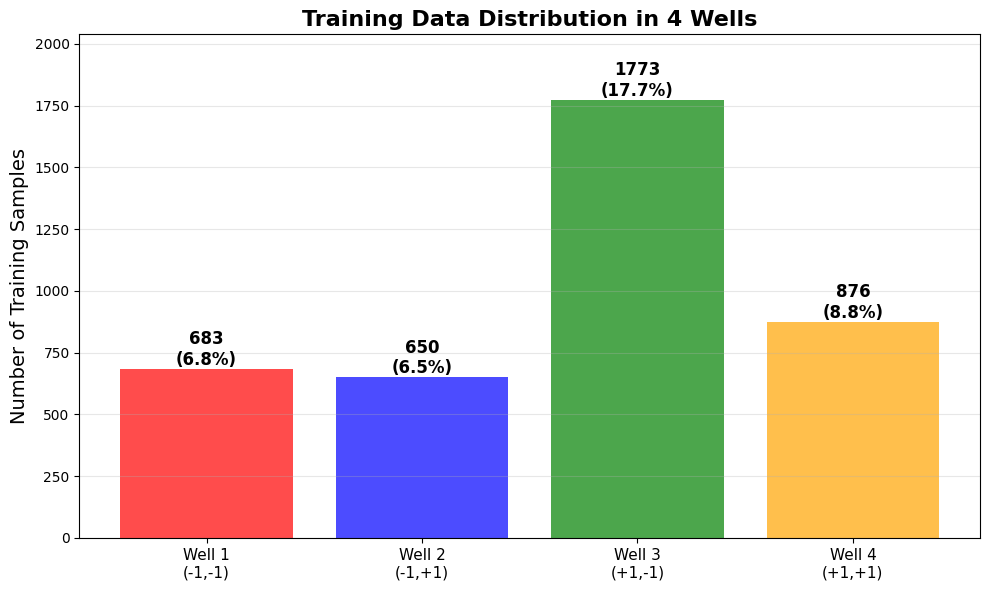


⚠️  IMBALANCE ANALYSIS:
   Max samples in one well: 1773
   Min samples in one well: 650
   Imbalance ratio: 2.73x

🟡 CAUTION: Moderate imbalance detected (ratio > 1.5x)
   Some wells may attract fewer particles.


In [11]:
# ============================================================
# Diagnostic: Check Training Data Distribution Across 4 Wells
# ============================================================

well_centers = np.array([[-1.0, -1.0], [-1.0, 1.0], [1.0, -1.0], [1.0, 1.0]])
well_radius = 0.4
well_labels = ['Well 1 (-1,-1)', 'Well 2 (-1,+1)', 'Well 3 (+1,-1)', 'Well 4 (+1,+1)']

print("="*70)
print("TRAINING DATA DISTRIBUTION IN 4 WELLS")
print("="*70)

training_basin_counts = []
for i, (center, label) in enumerate(zip(well_centers, well_labels)):
    distances = np.linalg.norm(X_tar - center, axis=1)
    count = np.sum(distances <= well_radius)
    training_basin_counts.append(count)
    percentage = 100.0 * count / len(X_tar)
    print(f"{label:20s}: {count:5d} samples ({percentage:5.1f}%)")

total_in_wells = sum(training_basin_counts)
total_samples = len(X_tar)
outside_wells = total_samples - total_in_wells

print("-"*70)
print(f"{'Total in wells':20s}: {total_in_wells:5d} samples ({100.0*total_in_wells/total_samples:5.1f}%)")
print(f"{'Outside wells':20s}: {outside_wells:5d} samples ({100.0*outside_wells/total_samples:5.1f}%)")
print(f"{'Total samples':20s}: {total_samples:5d}")
print("="*70)

# Visualization
fig, ax = plt.subplots(figsize=(10, 6))
x_positions = np.arange(len(well_labels))
bars = ax.bar(x_positions, training_basin_counts, color=['red', 'blue', 'green', 'orange'], alpha=0.7)

for i, (bar, count) in enumerate(zip(bars, training_basin_counts)):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{count}\n({100.0*count/total_samples:.1f}%)',
            ha='center', va='bottom', fontsize=12, fontweight='bold')

# ax.set_xlabel('Well', fontsize=14)
ax.set_ylabel('Number of Training Samples', fontsize=14)
ax.set_title('Training Data Distribution in 4 Wells', fontsize=16, fontweight='bold')
ax.set_xticks(x_positions)
ax.set_xticklabels(['Well 1\n(-1,-1)', 'Well 2\n(-1,+1)', 'Well 3\n(+1,-1)', 'Well 4\n(+1,+1)'], fontsize=11)
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(0, max(training_basin_counts) * 1.15)

plt.tight_layout()
plt.show()

# Check imbalance
max_count = max(training_basin_counts)
min_count = min(training_basin_counts)
imbalance_ratio = max_count / (min_count + 1e-10)

print(f"\n⚠️  IMBALANCE ANALYSIS:")
print(f"   Max samples in one well: {max_count}")
print(f"   Min samples in one well: {min_count}")
print(f"   Imbalance ratio: {imbalance_ratio:.2f}x")

if imbalance_ratio > 3.0:
    print(f"\n🔴 WARNING: Severe imbalance detected! (ratio > 3x)")
    print(f"   This likely explains why some wells don't get particles.")
    print(f"   Solution: Increase simulation time or re-generate trajectory.")
elif imbalance_ratio > 1.5:
    print(f"\n🟡 CAUTION: Moderate imbalance detected (ratio > 1.5x)")
    print(f"   Some wells may attract fewer particles.")
else:
    print(f"\n✅ Data distribution is reasonably balanced.")

In [12]:
# from deeptime.data import quadruple_well
# import matplotlib.pyplot as plt

# h = 1e-3 # step size of the Euler-Maruyama integrator
# n_steps = 10000 # number of steps, the lag time is thus tau = nSteps*h = 10
# x0 = np.zeros((1, 2)) # inital condition
# n = 10000 # number of evaluations of the  discretized dynamical system with lag time tau

# f = quadruple_well(n_steps=n_steps)  # loading the model
# traj = f.trajectory(x0, n, seed=42)

# m = 2500 # number of training data points
# X = np.random.uniform(-2, 2, size=(2500, 2)) # training data
# # X = 4*np.random.rand(2, m)-2
# Y = f(X, seed=42, n_jobs=1) # training data mapped forward by the dynamical system

# from deeptime.kernels import GaussianKernel
# from deeptime.decomposition import KernelEDMD

# # ============================================================
# # Kernel Definition (GaussianKernel)
# # ============================================================
# # Deeptime's GaussianKernel(sigma) defines:
# #   k(x, y) = exp(-||x - y||Â² / (2 * sigmaÂ²))
# # 
# # This is equivalent to RBF kernel with bandwidth epsilon = sigmaÂ²
# # So sigma=1 means epsilon=1
# # ============================================================

# sigma = 1  # kernel bandwidth parameter
# kernel = GaussianKernel(sigma)

# # ============================================================
# # Compute ALL eigenvalues using full eigendecomposition
# # ============================================================
# # Instead of only computing n_eigs=6, we'll compute ALL eigenvalues
# # by manually constructing the Koopman operator matrix

# def rbf_kernel_matrix(X1, X2, sigma):
#     """Compute RBF kernel matrix: k(x,y) = exp(-||x-y||Â²/(2*sigmaÂ²))"""
#     # Compute squared distances
#     X1_sq = np.sum(X1**2, axis=1, keepdims=True)  # (n1, 1)
#     X2_sq = np.sum(X2**2, axis=1, keepdims=True)  # (n2, 1)
#     sq_dists = X1_sq + X2_sq.T - 2 * (X1 @ X2.T)  # (n1, n2)
    
#     # Apply RBF kernel
#     K = np.exp(-sq_dists / (2 * sigma**2))
#     return K

# K_XX = rbf_kernel_matrix(X, X, sigma)  # shape: (2500, 2500)
# K_XY = rbf_kernel_matrix(X, Y, sigma)  # shape: (2500, 2500)

# # Construct Koopman operator K = K_XY @ (K_XX + epsilon*I)^{-1}
# epsilon_reg = 1e-3  # regularization parameter
# I_mat = np.eye(K_XX.shape[0])
# K_koopman = K_XY @ np.linalg.inv(K_XX + epsilon_reg * I_mat)

# # Compute ALL eigenvalues
# eigenvalues_all, eigenvectors_all = np.linalg.eig(K_koopman)

# # ============================================================
# # Visualization: Eigenvalues on Unit Circle
# # ============================================================

# fig, ax = plt.subplots(figsize=(5, 5))

# # Plot unit circle
# theta = np.linspace(0, 2*np.pi, 100)
# ax.plot(np.cos(theta), np.sin(theta), 'k--', linewidth=1, label='Unit Circle')

# # Plot eigenvalues
# ax.scatter(eigenvalues_all.real, eigenvalues_all.imag, c='red', s=50, marker='o', 
#            edgecolors='black', linewidths=1, label='Eigenvalues', zorder=3)

# # Set equal aspect ratio and labels
# ax.set_aspect('equal')
# ax.grid(True, alpha=0.3)
# ax.axhline(y=0, color='k', linewidth=0.5)
# ax.axvline(x=0, color='k', linewidth=0.5)
# ax.set_xlabel('Real', fontsize=12)
# ax.set_ylabel('Imaginary', fontsize=12)
# ax.set_title('Deeptime Kernel EDMD: Koopman Eigenvalues on Unit Circle', fontsize=14)
# ax.legend(fontsize=10)

# plt.tight_layout()
# plt.show()

# print(f"Number of eigenvalues: {len(eigenvalues_all)}")
# print(f"Max magnitude: {np.max(np.abs(eigenvalues_all)):.4f}")
# print(f"Eigenvalues outside unit circle: {np.sum(np.abs(eigenvalues_all) > 1)}")

# # Sort eigenvalues by real part (descending order)
# sorted_idx = np.argsort(np.abs(eigenvalues_all))[::-1]
# sorted_real_deeptime = np.sort(eigenvalues_all.real)[::-1]

# print("\n" + "="*50)
# print("Eigenvalues (Real part, sorted from large to small):")
# print("="*50)
# for i, real_part in enumerate(sorted_real_deeptime):
#     print(f"{i+1:3d}. {real_part:+.6f}")

In [13]:
# # ============================================================
# # Kernel EDMD: Extended Dynamic Mode Decomposition with RBF Kernel
# # ============================================================

# # Preconditions
# if 'X_tar' not in globals() or 'X_tar_next' not in globals():
#     raise RuntimeError('X_tar and X_tar_next must be computed before running Kernel EDMD.')

# n = X_tar.shape[0]

# # Step 1: Build Gaussian RBF kernel matrices
# # Compute bandwidth epsilon using median heuristic
# sq_tar = np.sum(X_tar ** 2, axis=1)
# H_tar = sq_tar[:, None] + sq_tar[None, :] - 2 * (X_tar @ X_tar.T)
# epsilon_kedmd = 0.5 * np.median(H_tar) / np.log(n + 1)

# def rbf_kernel(X, Y, eps):
#     """Gaussian RBF kernel k(x,y) = exp(-||x-y||Â²/(2Îµ))"""
#     sq_x = np.sum(X ** 2, axis=1)
#     sq_y = np.sum(Y ** 2, axis=1)
#     H = sq_x[:, None] + sq_y[None, :] - 2 * (X @ Y.T)
#     return np.exp(-H / (2 * eps))

# # Kernel matrices: K_xx = K(X_tar, X_tar), K_xy = K(X_tar, X_tar_next)
# K_xx = rbf_kernel(X_tar, X_tar, 1)
# K_xy = rbf_kernel(X_tar, X_tar_next, 1)

# # Step 2: Compute Koopman operator via kernel matrices
# # K = K_xy @ (K_xx + Î³I)^{-1}
# reg_kedmd = 1e-3  # Use strong regularization like deeptime
# I_kedmd = np.eye(n)
# K_kedmd = K_xy @ np.linalg.inv(K_xx + reg_kedmd * I_kedmd)

# # Step 3: Compute eigenvalues and eigenvectors
# eigenvalues_kedmd, eigenvectors_kedmd = np.linalg.eig(K_kedmd)

# # Step 4: Construct generator eigenvalues and inverse weights
# # Extract real part of eigenvalues (ignore imaginary part)
# lambda_ns_kedmd = eigenvalues_kedmd.real

# # Construct generator eigenvalues: Î»_gen = (Î»_K - 1) / dt
# lambda_gen_kedmd = (lambda_ns_kedmd - 1.0) / dt

# # Build inverse generator weights (for KSWGD)
# tol_kedmd = 1e-6
# lambda_ns_inv_kedmd = np.zeros_like(lambda_ns_kedmd)
# mask_kedmd = lambda_ns_kedmd >= tol_kedmd
# lambda_ns_inv_kedmd[mask_kedmd] = 1.0 / (lambda_ns_kedmd[mask_kedmd] + 0.001)

# # Store results for KSWGD
# eigvals_K_kedmd = lambda_ns_kedmd.copy()
# eigvecs_K_kedmd = eigenvectors_kedmd.copy()
# lambda_gen_full_kedmd = lambda_gen_kedmd.copy()

# # ============================================================
# # Visualization: Eigenvalues on Unit Circle
# # ============================================================

# fig, ax = plt.subplots(figsize=(5, 5))

# # Plot unit circle
# theta = np.linspace(0, 2*np.pi, 100)
# ax.plot(np.cos(theta), np.sin(theta), 'k--', linewidth=1, label='Unit Circle')

# # Plot eigenvalues
# ax.scatter(eigenvalues_kedmd.real, eigenvalues_kedmd.imag, c='red', s=50, marker='o', 
#            edgecolors='black', linewidths=1, label='Eigenvalues', zorder=3)

# # Set equal aspect ratio and labels
# ax.set_aspect('equal')
# ax.grid(True, alpha=0.3)
# ax.axhline(y=0, color='k', linewidth=0.5)
# ax.axvline(x=0, color='k', linewidth=0.5)
# ax.set_xlabel('Real', fontsize=12)
# ax.set_ylabel('Imaginary', fontsize=12)
# ax.set_title('Kernel EDMD: Koopman Eigenvalues on Unit Circle', fontsize=14)
# ax.legend(fontsize=10)

# plt.tight_layout()
# plt.show()

# print(f"Number of eigenvalues: {len(eigenvalues_kedmd)}")
# print(f"Max magnitude: {np.max(np.abs(eigenvalues_kedmd)):.4f}")
# print(f"Eigenvalues outside unit circle: {np.sum(np.abs(eigenvalues_kedmd) > 1)}")

# # Sort eigenvalues by real part (descending order)
# sorted_real_kedmd = np.sort(eigenvalues_kedmd.real)[::-1]

# print("\n" + "="*50)
# print("Eigenvalues (Real part, sorted from large to small):")
# print("="*50)
# for i, real_part in enumerate(sorted_real_kedmd):
#     print(f"{i+1:3d}. {real_part:+.6f}")

Using pre-selected GPU: cuda:0
  GPU Name: NVIDIA GeForce RTX 3090

DM Method: n=9999, truncated SVD rank k=501
  (Full SVD rank would be 9999 — truncated is ~20x fewer components)

[Step 1/6] Building Gaussian kernel matrix (9999×9999)... Done (2.61s)
  Adaptive epsilon = 0.146556 (c_epsilon = 0.5)
[Step 2/6] Anisotropic normalization... Done (0.01s)
[Step 3/6] Random-walk normalization... Done (0.00s)
[Step 4/6] Truncated SVD (rank 501) on 9999×9999 matrix...
         Using torch.svd_lowrank (randomized algorithm)
         Complexity: O(n²·k) ≈ 50.1G ops  vs  full SVD O(n³) ≈ 999.7G ops
         Done (2.94s)
[Step 5/6] Constructing generator eigenvalues... Done (0.00s)
[Step 6/6] Building inverse generator weights... Done (0.00s)

DM Method complete! Total time: 5.59s
  Step breakdown:
    Kernel matrix   :   2.61s ( 46.8%)
    Aniso. norm     :   0.01s (  0.2%)
    RW norm         :   0.00s (  0.0%)
    Truncated SVD   :   2.94s ( 52.6%)
    Gen. eigenvals  :   0.00s (  0.0%)
    In

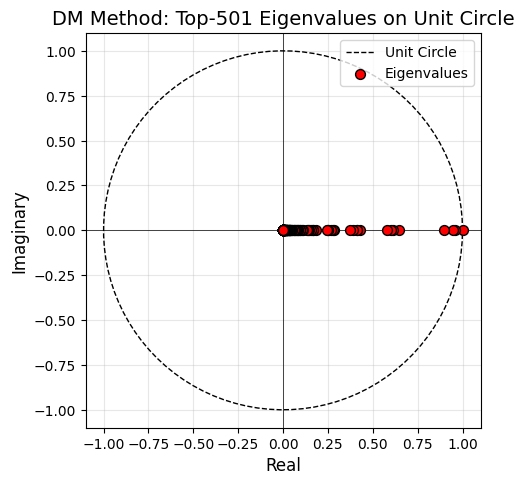

Number of eigenvalues: 501
Max magnitude: 1.0029
Eigenvalues outside unit circle: 1

Eigenvalues (Real part, sorted from large to small):
  1. +1.002871
  2. +0.956837
  3. +0.944829
  4. +0.898828
  5. +0.648912
  6. +0.613979
  7. +0.598922
  8. +0.581885
  9. +0.429994
 10. +0.414469
 11. +0.411558
 12. +0.392379
 13. +0.375508
 14. +0.283237
 15. +0.278550
 16. +0.265573
 17. +0.251302
 18. +0.250389
 19. +0.244518
 20. +0.182168
 21. +0.168690
 22. +0.167168
 23. +0.155108
 24. +0.145432
 25. +0.140240
 26. +0.134401
 27. +0.113713
 28. +0.107868
 29. +0.095516
 30. +0.093203
 31. +0.082128
 32. +0.081206
 33. +0.076354
 34. +0.074262
 35. +0.067390
 36. +0.063573
 37. +0.061002
 38. +0.051511
 39. +0.050122
 40. +0.044125
 41. +0.040888
 42. +0.040183
 43. +0.039145
 44. +0.035469
 45. +0.034923
 46. +0.034532
 47. +0.031355
 48. +0.026118
 49. +0.024709
 50. +0.022441
 51. +0.021382
 52. +0.020790
 53. +0.020094
 54. +0.019508
 55. +0.017589
 56. +0.016943
 57. +0.016764
 58. +0

In [14]:
# ============================================================
# DM Method: Diffusion Maps for Langevin Generator Construction
# (GPU-accelerated version using PyTorch with Truncated SVD)
# ============================================================

import time as _time

# Note: GPU device (device_compute, device) was already selected in Cell 2
# We just verify and use the pre-selected GPU here
print(f"Using pre-selected GPU: {device_compute}")
if best_gpu_idx >= 0:
    print(f"  GPU Name: {torch.cuda.get_device_name(best_gpu_idx)}")

# Preconditions
if 'X_tar' not in globals() or 'X_tar_next' not in globals():
    raise RuntimeError('X_tar and X_tar_next must be computed before running DM method.')

n = X_tar.shape[0]

# Determine number of truncated SVD components needed
# We need n_skip + k_modes_dm_fixed eigenvalues, plus a buffer for safety
_k_needed = n_skip + (k_modes_dm_fixed if k_modes_dm_fixed is not None else 500)
k_svd = min(_k_needed + 20, n)  # add buffer of 20, cap at n

print(f"\n{'='*60}")
print(f"DM Method: n={n}, truncated SVD rank k={k_svd}")
print(f"  (Full SVD rank would be {n} — truncated is ~{n/k_svd:.0f}x fewer components)")
print(f"{'='*60}")

total_t0 = _time.time()
step_times = []

# ---- Step 1/6: Build Gaussian kernel on GPU ----
step_t = _time.time()
print(f"\n[Step 1/6] Building Gaussian kernel matrix ({n}×{n})...", end=' ', flush=True)

X_tar_gpu = torch.tensor(X_tar, dtype=torch.float64, device=device_compute)
sq_tar_gpu = torch.sum(X_tar_gpu ** 2, dim=1)
H_gpu = sq_tar_gpu[:, None] + sq_tar_gpu[None, :] - 2 * (X_tar_gpu @ X_tar_gpu.T)

# Convert to NumPy for median calculation
H = H_gpu.cpu().numpy()
epsilon = c_epsilon * np.median(H) / np.log(n + 1)  # Adaptive bandwidth using c_epsilon from Cell 1

# Gaussian kernel on GPU
data_kernel_gpu = torch.exp(-H_gpu / (2 * epsilon))

elapsed = _time.time() - step_t
step_times.append(elapsed)
print(f"Done ({elapsed:.2f}s)")
print(f"  Adaptive epsilon = {epsilon:.6f} (c_epsilon = {c_epsilon})")

# ---- Step 2/6: Anisotropic normalization on GPU ----
step_t = _time.time()
print(f"[Step 2/6] Anisotropic normalization...", end=' ', flush=True)

p_x_gpu = torch.sqrt(torch.sum(data_kernel_gpu, dim=1))
p_y_gpu = p_x_gpu.clone()
data_kernel_norm_gpu = data_kernel_gpu / p_x_gpu[:, None] / p_y_gpu[None, :]
D_y_gpu = torch.sum(data_kernel_norm_gpu, dim=0)

elapsed = _time.time() - step_t
step_times.append(elapsed)
print(f"Done ({elapsed:.2f}s)")

# ---- Step 3/6: Random-walk symmetric normalization on GPU ----
step_t = _time.time()
print(f"[Step 3/6] Random-walk normalization...", end=' ', flush=True)

rw_kernel_gpu = data_kernel_norm_gpu / D_y_gpu[:, None]

elapsed = _time.time() - step_t
step_times.append(elapsed)
print(f"Done ({elapsed:.2f}s)")

# ---- Step 4/6: Truncated SVD on GPU (MUCH faster than full SVD) ----
step_t = _time.time()
print(f"[Step 4/6] Truncated SVD (rank {k_svd}) on {n}×{n} matrix...")
print(f"         Using torch.svd_lowrank (randomized algorithm)")
print(f"         Complexity: O(n²·k) ≈ {n**2*k_svd/1e9:.1f}G ops  vs  full SVD O(n³) ≈ {n**3/1e9:.1f}G ops")

phi_gpu, s_gpu, _ = torch.svd_lowrank(rw_kernel_gpu, q=k_svd, niter=4)
lambda_ns = s_gpu.cpu().numpy()  # Singular values (eigenvalues of symmetric matrix)
phi = phi_gpu.cpu().numpy()

elapsed = _time.time() - step_t
step_times.append(elapsed)
print(f"         Done ({elapsed:.2f}s)")

# ---- Step 5/6: Construct generator eigenvalues ----
step_t = _time.time()
print(f"[Step 5/6] Constructing generator eigenvalues...", end=' ', flush=True)

lambda_gen_dm = (lambda_ns - 1.0) / epsilon

elapsed = _time.time() - step_t
step_times.append(elapsed)
print(f"Done ({elapsed:.2f}s)")

# ---- Step 6/6: Build inverse generator weights (for KSWGD) ----
step_t = _time.time()
print(f"[Step 6/6] Building inverse generator weights...", end=' ', flush=True)

tol = 1e-6
lambda_ns_inv = np.zeros_like(lambda_ns)
mask = lambda_ns >= tol
lambda_ns_inv[mask] = epsilon / (lambda_ns[mask] + 0.001)

elapsed = _time.time() - step_t
step_times.append(elapsed)
print(f"Done ({elapsed:.2f}s)")

# Store results for KSWGD
eigvals_K_dm = lambda_ns.copy()
eigvecs_K_dm = phi.copy()
lambda_gen_full = lambda_gen_dm.copy()

# Keep numpy versions for compatibility (only variables used downstream)
D_y = D_y_gpu.cpu().numpy()
p_x = p_x_gpu.cpu().numpy()
p_y = p_y_gpu.cpu().numpy()

# Clean up GPU memory
del X_tar_gpu, sq_tar_gpu, H_gpu, data_kernel_gpu, p_x_gpu, p_y_gpu
del data_kernel_norm_gpu, D_y_gpu, rw_kernel_gpu, phi_gpu, s_gpu
torch.cuda.empty_cache()

total_elapsed = _time.time() - total_t0
print(f"\n{'='*60}")
print(f"DM Method complete! Total time: {total_elapsed:.2f}s")
print(f"{'='*60}")
print(f"  Step breakdown:")
step_names = ['Kernel matrix', 'Aniso. norm', 'RW norm', 'Truncated SVD', 'Gen. eigenvals', 'Inv. weights']
for name, t in zip(step_names, step_times):
    pct = 100 * t / total_elapsed if total_elapsed > 0 else 0
    print(f"    {name:<16s}: {t:6.2f}s ({pct:5.1f}%)")
print(f"  Truncated eigenvalues: {len(eigvals_K_dm)} (of {n} total)")
print(f"  Top eigenvalue: {eigvals_K_dm[0]:.6f}")
print(f"{'='*60}")

# ============================================================
# Visualization: Eigenvalues on Unit Circle
# ============================================================

fig, ax = plt.subplots(figsize=(5, 5))

# Plot unit circle
theta = np.linspace(0, 2*np.pi, 100)
ax.plot(np.cos(theta), np.sin(theta), 'k--', linewidth=1, label='Unit Circle')

# Plot eigenvalues
ax.scatter(eigvals_K_dm.real, eigvals_K_dm.imag, c='red', s=50, marker='o', 
           edgecolors='black', linewidths=1, label='Eigenvalues', zorder=3)

# Set equal aspect ratio and labels
ax.set_aspect('equal')
ax.grid(True, alpha=0.3)
ax.axhline(y=0, color='k', linewidth=0.5)
ax.axvline(x=0, color='k', linewidth=0.5)
ax.set_xlabel('Real', fontsize=12)
ax.set_ylabel('Imaginary', fontsize=12)
ax.set_title(f'DM Method: Top-{k_svd} Eigenvalues on Unit Circle', fontsize=14)
ax.legend(fontsize=10)

plt.tight_layout()
plt.show()

print(f"Number of eigenvalues: {len(eigvals_K_dm)}")
print(f"Max magnitude: {np.max(np.abs(eigvals_K_dm)):.4f}")
print(f"Eigenvalues outside unit circle: {np.sum(np.abs(eigvals_K_dm) > 1)}")

# Sort eigenvalues by real part (descending order)
sorted_real_dm = np.sort(eigvals_K_dm.real)[::-1]

print("\n" + "="*50)
print("Eigenvalues (Real part, sorted from large to small):")
print("="*50)
for i, real_part in enumerate(sorted_real_dm):
    print(f"{i+1:3d}. {real_part:+.6f}")

## DMPS Analysis: KL Divergence & Boltzmann Sampling

1. Track KL divergence between particle distribution and true Boltzmann distribution during gradient descent
2. Sample from Boltzmann distribution $\pi(x) \propto e^{-V(x)}$ to show spread around well bottoms

In [15]:
# ============================================================
# Helpers: KL Divergence & Boltzmann Sampling
# ============================================================

from scipy.stats import gaussian_kde

def sample_from_boltzmann(potential, n_samples, x_range=(-2, 2), y_range=(-2, 2), n_mcmc=50000, burnin=5000):
    """
    Sample from Boltzmann distribution π(x) ∝ exp(-V(x)/T) using MCMC (Metropolis-Hastings)
    """
    samples = []
    x_curr = np.array([0.0, 0.0])  # Start near origin
    proposal_std = 0.5
    
    for i in range(n_mcmc + burnin):
        # Propose new point
        x_prop = x_curr + proposal_std * np.random.randn(2)
        
        # Check bounds
        if x_range[0] <= x_prop[0] <= x_range[1] and y_range[0] <= x_prop[1] <= y_range[1]:
            # Compute acceptance ratio
            V_curr = potential.V(x_curr.reshape(1, -1))[0]
            V_prop = potential.V(x_prop.reshape(1, -1))[0]
            log_alpha = -(V_prop - V_curr) / potential.T
            
            if np.log(np.random.rand()) < log_alpha:
                x_curr = x_prop
        
        if i >= burnin:
            samples.append(x_curr.copy())
    
    # Subsample to get desired number
    samples = np.array(samples)
    indices = np.random.choice(len(samples), size=n_samples, replace=False)
    return samples[indices]

def compute_kl_divergence_kde(particles, potential, x_range=(-2, 2), y_range=(-2, 2), n_grid=50):
    """
    Compute KL divergence D_KL(q || π) where q is particle distribution and π is Boltzmann
    Uses grid-based approximation with KDE for particle distribution
    """
    # Create evaluation grid
    x_eval = np.linspace(x_range[0], x_range[1], n_grid)
    y_eval = np.linspace(y_range[0], y_range[1], n_grid)
    X_eval, Y_eval = np.meshgrid(x_eval, y_eval)
    positions = np.vstack([X_eval.ravel(), Y_eval.ravel()])
    
    dx = (x_range[1] - x_range[0]) / n_grid
    dy = (y_range[1] - y_range[0]) / n_grid
    
    # Compute true Boltzmann density (normalized)
    V_grid = potential.V(X_eval, Y_eval)
    pi_unnorm = np.exp(-V_grid / potential.T)
    Z = np.sum(pi_unnorm) * dx * dy
    pi_grid = pi_unnorm / Z
    pi_flat = pi_grid.ravel()
    
    # Estimate particle density using KDE
    try:
        kde = gaussian_kde(particles.T, bw_method='scott')
        q_flat = kde(positions)
        q_flat = q_flat / (np.sum(q_flat) * dx * dy)  # Normalize
    except:
        # If KDE fails (e.g., singular matrix), return large value
        return 100.0
    
    # Compute KL divergence: D_KL(q || π) = ∫ q(x) log(q(x)/π(x)) dx
    # Add small epsilon to avoid log(0)
    eps = 1e-10
    q_safe = np.maximum(q_flat, eps)
    pi_safe = np.maximum(pi_flat, eps)
    
    kl = np.sum(q_flat * np.log(q_safe / pi_safe)) * dx * dy
    return max(kl, 0)  # KL should be non-negative

print("✓ Helper functions initialized.")

# ============================================================
# GPU-Accelerated Helper Functions (PyTorch)
# ============================================================

import torch

# Check GPU availability
if torch.cuda.is_available():
    device_compute = torch.device('cuda:0')  # Explicitly use GPU-0
    print(f"\n✓ GPU available: {torch.cuda.get_device_name(0)}")
else:
    device_compute = torch.device('cpu')
    print("\n⚠ GPU not available, using CPU")

def evaluate_kernel_at_points_gpu(X_query, X_data, epsilon_val, p_x_val, D_y_val):
    """GPU version of kernel evaluation (using float64 for precision)"""
    # Convert to torch tensors if needed
    if not isinstance(X_query, torch.Tensor):
        X_query = torch.from_numpy(X_query).double().to(device_compute)
    if not isinstance(X_data, torch.Tensor):
        X_data = torch.from_numpy(X_data).double().to(device_compute)
    if not isinstance(p_x_val, torch.Tensor):
        p_x_val = torch.from_numpy(p_x_val).double().to(device_compute)
    if not isinstance(D_y_val, torch.Tensor):
        D_y_val = torch.from_numpy(D_y_val).double().to(device_compute)
    
    sq_query = torch.sum(X_query ** 2, dim=1)
    sq_data = torch.sum(X_data ** 2, dim=1)
    H = sq_query[:, None] + sq_data[None, :] - 2 * (X_query @ X_data.T)
    K_raw = torch.exp(-H / (2 * epsilon_val))
    p_query = torch.sqrt(torch.sum(K_raw, dim=1))
    K_norm = K_raw / p_query[:, None] / p_x_val[None, :]
    return K_norm / D_y_val[None, :]

def compute_kernel_gradient_gpu(X_query, X_data, epsilon_val, p_x_val):
    """GPU version of kernel gradient computation (using float64 for precision)"""
    # Convert to torch tensors if needed
    if not isinstance(X_query, torch.Tensor):
        X_query = torch.from_numpy(X_query).double().to(device_compute)
    if not isinstance(X_data, torch.Tensor):
        X_data = torch.from_numpy(X_data).double().to(device_compute)
    if not isinstance(p_x_val, torch.Tensor):
        p_x_val = torch.from_numpy(p_x_val).double().to(device_compute)
    
    diff = X_query[:, None, :] - X_data[None, :, :]
    sq_query = torch.sum(X_query ** 2, dim=1)
    sq_data = torch.sum(X_data ** 2, dim=1)
    H = sq_query[:, None] + sq_data[None, :] - 2 * (X_query @ X_data.T)
    K_raw = torch.exp(-H / (2 * epsilon_val))
    grad_K_raw = -K_raw[:, :, None] * diff / epsilon_val
    p_query = torch.sqrt(torch.sum(K_raw, dim=1, keepdim=True))
    return grad_K_raw / p_query[:, :, None] / p_x_val[None, :, None]

print("✓ GPU helper functions initialized.")

✓ Helper functions initialized.

✓ GPU available: NVIDIA GeForce RTX 3090
✓ GPU helper functions initialized.


In [16]:
# ============================================================
# GPU-Accelerated Helper Functions (PyTorch)
# ============================================================

import torch
import subprocess

def get_most_free_gpu():
    """
    Query nvidia-smi to find the GPU with the lowest utilization.
    Returns the GPU index with the most free resources.
    """
    try:
        result = subprocess.run(
            ['nvidia-smi', '--query-gpu=index,memory.used,memory.total,utilization.gpu', '--format=csv,noheader,nounits'],
            capture_output=True, text=True, check=True
        )
        lines = result.stdout.strip().split('\n')
        
        best_gpu = 0
        best_score = float('inf')  # Lower is better (less utilization)
        
        print("\n" + "="*60)
        print("GPU Status:")
        print("="*60)
        
        for line in lines:
            parts = [p.strip() for p in line.split(',')]
            idx = int(parts[0])
            mem_used = float(parts[1])
            mem_total = float(parts[2])
            util = float(parts[3])
            
            # Score based on utilization and memory usage
            mem_usage_pct = 100 * mem_used / mem_total
            score = util + mem_usage_pct  # Combined score (lower is better)
            
            print(f"  GPU-{idx}: Utilization={util:.0f}%, Memory={mem_used:.0f}/{mem_total:.0f} MiB ({mem_usage_pct:.1f}%)")
            
            if score < best_score:
                best_score = score
                best_gpu = idx
        
        print(f"\n>>> Selected GPU-{best_gpu} (lowest utilization)")
        print("="*60)
        return best_gpu
        
    except Exception as e:
        print(f"Warning: Could not query GPU status: {e}")
        print("Defaulting to GPU-0")
        return 0

# Check GPU availability and select the most free GPU
if torch.cuda.is_available():
    best_gpu_idx = get_most_free_gpu()
    device_compute = torch.device(f'cuda:{best_gpu_idx}')
    
    # Print detailed GPU info
    print("\n" + "="*60)
    print("CURRENT GPU CONFIGURATION")
    print("="*60)
    print(f"  Device:        cuda:{best_gpu_idx}")
    print(f"  GPU Name:      {torch.cuda.get_device_name(best_gpu_idx)}")
    print(f"  Total Memory:  {torch.cuda.get_device_properties(best_gpu_idx).total_memory / 1024**3:.1f} GB")
    print(f"  CUDA Version:  {torch.version.cuda}")
    print("="*60)
    print(f"✓ All computations will run on GPU-{best_gpu_idx}")
else:
    device_compute = torch.device('cpu')
    print("\n⚠ GPU not available, using CPU")

def evaluate_kernel_at_points_gpu(X_query, X_data, epsilon_val, p_x_val, D_y_val):
    """GPU version of kernel evaluation (using float64 for precision)"""
    # Convert to torch tensors if needed
    if not isinstance(X_query, torch.Tensor):
        X_query = torch.from_numpy(X_query).double().to(device_compute)
    if not isinstance(X_data, torch.Tensor):
        X_data = torch.from_numpy(X_data).double().to(device_compute)
    if not isinstance(p_x_val, torch.Tensor):
        p_x_val = torch.from_numpy(p_x_val).double().to(device_compute)
    if not isinstance(D_y_val, torch.Tensor):
        D_y_val = torch.from_numpy(D_y_val).double().to(device_compute)
    
    sq_query = torch.sum(X_query ** 2, dim=1)
    sq_data = torch.sum(X_data ** 2, dim=1)
    H = sq_query[:, None] + sq_data[None, :] - 2 * (X_query @ X_data.T)
    K_raw = torch.exp(-H / (2 * epsilon_val))
    p_query = torch.sqrt(torch.sum(K_raw, dim=1))
    K_norm = K_raw / p_query[:, None] / p_x_val[None, :]
    return K_norm / D_y_val[None, :]

def compute_kernel_gradient_gpu(X_query, X_data, epsilon_val, p_x_val):
    """GPU version of kernel gradient computation (using float64 for precision)"""
    # Convert to torch tensors if needed
    if not isinstance(X_query, torch.Tensor):
        X_query = torch.from_numpy(X_query).double().to(device_compute)
    if not isinstance(X_data, torch.Tensor):
        X_data = torch.from_numpy(X_data).double().to(device_compute)
    if not isinstance(p_x_val, torch.Tensor):
        p_x_val = torch.from_numpy(p_x_val).double().to(device_compute)
    
    diff = X_query[:, None, :] - X_data[None, :, :]
    sq_query = torch.sum(X_query ** 2, dim=1)
    sq_data = torch.sum(X_data ** 2, dim=1)
    H = sq_query[:, None] + sq_data[None, :] - 2 * (X_query @ X_data.T)
    K_raw = torch.exp(-H / (2 * epsilon_val))
    grad_K_raw = -K_raw[:, :, None] * diff / epsilon_val
    p_query = torch.sqrt(torch.sum(K_raw, dim=1, keepdim=True))
    return grad_K_raw / p_query[:, :, None] / p_x_val[None, :, None]

print("✓ GPU helper functions initialized.")


GPU Status:
  GPU-0: Utilization=0%, Memory=390/24576 MiB (1.6%)

>>> Selected GPU-0 (lowest utilization)

CURRENT GPU CONFIGURATION
  Device:        cuda:0
  GPU Name:      NVIDIA GeForce RTX 3090
  Total Memory:  23.6 GB
  CUDA Version:  13.0
✓ All computations will run on GPU-0
✓ GPU helper functions initialized.


## Convergence Analysis: DMPS with Metrics Tracking

Run DMPS for n_iter_kswgd (currently 10000) steps and track convergence metrics every 100 steps

## KSWGD Global Parameters

Define shared parameters for both DMPS and Koopman(SDMD) methods:

In [17]:
# ============================================================
# DMPS: Running n_iter_kswgd iterations with metrics tracking
# ============================================================

print("="*60)
print(f"DMPS: Running {n_iter_kswgd} iterations with metrics tracking...")
print("="*60)

# ============================================================
# Step 0: Prepare GPU tensors and initialize particles
# ============================================================

# Define well parameters
well_centers = np.array([[-1.0, -1.0], [-1.0, 1.0], [1.0, -1.0], [1.0, 1.0]])
well_radius = 0.4

# Initialize particles from 2D Gaussian distribution (use global n_init_particles from Cell 1)
if random_seed is not None:
    np.random.seed(random_seed)
    print(f"Using random seed: {random_seed}")
else:
    print("Random seed: None (using non-deterministic randomness)")

# Generate particles from 2D Standard Gaussian: N(mean=[0,0], cov=I)
gaussian_mean = np.array([0.0, 0.0])
gaussian_std = 1.0  # Standard deviation = 1 (standard Gaussian)
X_init_gaussian = np.random.normal(
    loc=gaussian_mean,
    scale=gaussian_std,
    size=(n_init_particles, 2)
)

# Keep all particles including those inside wells (no filtering)
X_kswgd_init = X_init_gaussian.copy()

# Count particles inside wells for information
dist_to_wells = np.array([np.linalg.norm(X_init_gaussian - center, axis=1) for center in well_centers])
min_dist_to_wells = np.min(dist_to_wells, axis=0)
n_inside_wells = np.sum(min_dist_to_wells <= well_radius)

print(f"Initialized {X_kswgd_init.shape[0]} particles from 2D Gaussian")
print(f"  Mean: {gaussian_mean}, Std: {gaussian_std}")
print(f"  Particles inside wells: {n_inside_wells}/{n_init_particles} (kept, not filtered)")

# Prepare GPU tensors for DM kernel
X_tar_gpu = torch.from_numpy(X_tar).double().to(device_compute)
p_x_gpu = torch.from_numpy(p_x).double().to(device_compute)
D_y_gpu = torch.from_numpy(D_y).double().to(device_compute)

# Mode selection for DM (use global eig_threshold and n_skip from Cell 1)
eigvals_after_skip = eigvals_K_dm[n_skip:]

# Use fixed mode count if specified, otherwise use threshold
if k_modes_dm_fixed is not None:
    k_modes = min(k_modes_dm_fixed, len(eigvals_after_skip))  # Don't exceed available modes
    print(f"Using fixed mode count: {k_modes}")
else:
    valid_mask = eigvals_after_skip.real > eig_threshold
    k_modes = np.sum(valid_mask)
    print(f"Using threshold {eig_threshold}, got {k_modes} modes")

mode_start = n_skip
mode_end = mode_start + k_modes

print(f"DM modes: {k_modes} (from {mode_start+1} to {mode_end})")

# Build inverse generator weights for DM
lambda_gen_selected = lambda_gen_full[mode_start:mode_end]
tol_gen = 1e-6
lambda_gen_inv_selected = np.zeros(k_modes, dtype=complex)
mask_nonzero = np.abs(lambda_gen_selected) > tol_gen
lambda_gen_inv_selected[mask_nonzero] = 1.0 / lambda_gen_selected[mask_nonzero]

# Prepare GPU tensors for eigenvectors
eigvecs_selected_gpu = torch.from_numpy(eigvecs_K_dm[:, mode_start:mode_end]).double().to(device_compute)
lambda_gen_inv_selected_gpu = torch.from_numpy(lambda_gen_inv_selected).to(device_compute).to(torch.complex128)

print(f"GPU tensors prepared for DM on: {device_compute}")

# Use global parameters from Cell 1: n_iter_kswgd, h_kswgd, record_interval
n_particles = X_kswgd_init.shape[0]
n_records = n_iter_kswgd // record_interval + 1  # Include step 0

# Initialize trajectory storage
X_kswgd_traj_dm = np.zeros((n_particles, 2, n_iter_kswgd + 1))
X_kswgd_traj_dm[:, :, 0] = X_kswgd_init.copy()

# Initialize metrics storage
metrics_dm = {
    'steps': [],
    'well_coverage': [],  # Percentage of particles in wells
    'avg_potential': [],  # Average potential energy
    'movement_rate': []   # Average displacement per step
}

print(f"Particles: {n_particles}")
print(f"Iterations: {n_iter_kswgd}")
print(f"Recording interval: {record_interval} steps")
print(f"Total records: {n_records}")

# Helper function to compute metrics
def compute_metrics(X_current, X_previous=None):
    """Compute convergence metrics for current particle positions"""
    # 1. Well coverage: percentage in wells
    dist_to_wells = np.array([np.linalg.norm(X_current - center, axis=1) 
                              for center in well_centers])
    min_dist = np.min(dist_to_wells, axis=0)
    in_well = min_dist <= well_radius
    coverage = 100.0 * np.sum(in_well) / len(X_current)
    
    # 2. Average potential energy
    avg_V = np.mean(potential.V(X_current))
    
    # 3. Movement rate (only if previous positions available)
    if X_previous is not None:
        displacement = np.linalg.norm(X_current - X_previous, axis=1)
        movement = np.mean(displacement)
    else:
        movement = 0.0
    
    return coverage, avg_V, movement

# Record initial state (step 0)
coverage_0, avg_V_0, _ = compute_metrics(X_kswgd_traj_dm[:, :, 0])
metrics_dm['steps'].append(0)
metrics_dm['well_coverage'].append(coverage_0)
metrics_dm['avg_potential'].append(avg_V_0)
metrics_dm['movement_rate'].append(0.0)

print(f"\nInitial state (step 0):")
print(f"  Well coverage: {coverage_0:.2f}%")
print(f"  Avg potential: {avg_V_0:.4f}")

# Step 2: Run KSWGD iterations with DM kernel
print(f"\n{'='*60}")
print("Running DMPS iterations...")
print(f"{'='*60}")

for t in range(n_iter_kswgd):
    X_curr = X_kswgd_traj_dm[:, :, t]
    X_curr_gpu = torch.from_numpy(X_curr).double().to(device_compute)
    
    # Evaluate kernel between current particles and training data (GPU)
    K_curr_gpu = evaluate_kernel_at_points_gpu(X_curr_gpu, X_tar_gpu, epsilon, p_x_gpu, D_y_gpu)
    
    # Project onto eigenmodes (GPU)
    c_gpu = eigvecs_selected_gpu.T @ K_curr_gpu.T  # float64 result
    # Convert c_gpu to complex128 for multiplication with complex128 lambda_gen_inv
    c_gpu_complex = c_gpu.to(torch.complex128)
    c_inv_gpu = lambda_gen_inv_selected_gpu[:, None] * c_gpu_complex
    f_inv_gpu = eigvecs_selected_gpu @ c_inv_gpu.real  # Use real part for final computation
    
    # Compute gradient using kernel gradient (GPU)
    grad_K_gpu = compute_kernel_gradient_gpu(X_curr_gpu, X_tar_gpu, epsilon, p_x_gpu)
    
    # Gradient update (GPU, float64 dtype)
    grad_driving_gpu = torch.zeros((n_particles, 2), dtype=torch.float64, device=device_compute)
    for d_idx in range(2):
        grad_driving_gpu[:, d_idx] = torch.sum(grad_K_gpu[:, :, d_idx] * f_inv_gpu.T, dim=1)
    
    # Update: X = X - h * grad_driving (GPU)
    X_next_gpu = X_curr_gpu - h_kswgd * grad_driving_gpu
    X_kswgd_traj_dm[:, :, t+1] = X_next_gpu.cpu().numpy()
    
    # Record metrics every record_interval steps
    if (t + 1) % record_interval == 0:
        X_prev = X_kswgd_traj_dm[:, :, t]
        X_next = X_kswgd_traj_dm[:, :, t+1]
        coverage, avg_V, movement = compute_metrics(X_next, X_prev)
        
        metrics_dm['steps'].append(t + 1)
        metrics_dm['well_coverage'].append(coverage)
        metrics_dm['avg_potential'].append(avg_V)
        metrics_dm['movement_rate'].append(movement)
    
    # Progress indicator
    if (t+1) % 200 == 0 or t == 0:
        print(f"\r  [DM] Iteration {t+1}/{n_iter_kswgd}  ", end='', flush=True)

print()  # Newline after loop
print("DMPS iteration complete!")

# Step 3: Final summary
final_coverage = metrics_dm['well_coverage'][-1]
final_potential = metrics_dm['avg_potential'][-1]
final_movement = metrics_dm['movement_rate'][-1]

print(f"\n{'='*60}")
print("DMPS Final Results:")
print(f"{'='*60}")
print(f"Final well coverage: {final_coverage:.2f}%")
print(f"Final avg potential: {final_potential:.4f}")
print(f"Final movement rate: {final_movement:.6f}")
print(f"Total records: {len(metrics_dm['steps'])}")
print(f"{'='*60}")

print("\nDMPS metrics saved in 'metrics_dm' dictionary")

# Convert metrics to numpy arrays for easier plotting
for key in ['steps', 'well_coverage', 'avg_potential', 'movement_rate']:
    metrics_dm[key] = np.array(metrics_dm[key])

DMPS: Running 10000 iterations with metrics tracking...
Using random seed: 2
Initialized 2000 particles from 2D Gaussian
  Mean: [0. 0.], Std: 1.0
  Particles inside wells: 220/2000 (kept, not filtered)
Using fixed mode count: 480
DM modes: 480 (from 2 to 481)
GPU tensors prepared for DM on: cuda:0
Particles: 2000
Iterations: 10000
Recording interval: 100 steps
Total records: 101

Initial state (step 0):
  Well coverage: 11.00%
  Avg potential: 4.4475

Running DMPS iterations...
  [DM] Iteration 10000/10000  
DMPS iteration complete!

DMPS Final Results:
Final well coverage: 25.40%
Final avg potential: 3.5654
Final movement rate: 0.000014
Total records: 101

DMPS metrics saved in 'metrics_dm' dictionary


2.11.0+cu130 True
13.0
Using pre-selected GPU: cuda:0
  GPU Name: NVIDIA GeForce RTX 3090
Set solver_sdmd_torch_gpu.device = cuda:0
Shape of X: (9999, 2)
Shape of Y: (9999, 2)
(6999, 2)
Epoch: 1 	Training Loss: 0.224350 	Validation Loss: 0.023419
Saving model, validation loss improved: 0.023419 < 10000.000000
Epoch: 2 	Training Loss: 0.021978 	Validation Loss: 0.020082
Saving model, validation loss improved: 0.020082 < 0.023419
Epoch: 3 	Training Loss: 0.021160 	Validation Loss: 0.019761
Saving model, validation loss improved: 0.019761 < 0.020082
Epoch: 4 	Training Loss: 0.020777 	Validation Loss: 0.019574
Saving model, validation loss improved: 0.019574 < 0.019761
Epoch: 5 	Training Loss: 0.020527 	Validation Loss: 0.019422
Saving model, validation loss improved: 0.019422 < 0.019574
Epoch: 6 	Training Loss: 0.020389 	Validation Loss: 0.019298
Saving model, validation loss improved: 0.019298 < 0.019422
Epoch: 7 	Training Loss: 0.020048 	Validation Loss: 0.019230
Saving model, validatio

Processing batches:   0%|          | 0/110 [00:00<?, ?batch/s]/workspace/kswgd/solver_sdmd_torch_gpu.py:546: FutureWarning: We've integrated functorch into PyTorch. As the final step of the integration, `functorch.vmap` is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use `torch.vmap` instead; see the PyTorch 2.0 release notes and/or the `torch.func` migration guide for more details https://pytorch.org/docs/main/func.migrating.html
  batch_J = vmap(jac_fn)(batch_inputs)  # (batch_size, F, D)
/workspace/kswgd/solver_sdmd_torch_gpu.py:547: FutureWarning: We've integrated functorch into PyTorch. As the final step of the integration, `functorch.vmap` is deprecated as of PyTorch 2.0 and will be deleted in a future version of PyTorch >= 2.3. Please use `torch.vmap` instead; see the PyTorch 2.0 release notes and/or the `torch.func` migration guide for more details https://pytorch.org/docs/main/func.migrating.html
  batch_H = vmap(hess_fn)(batch

saving FNN a and b to:  a_b_example_quadruple_well.jbl
Outer Epoch 1/6


Processing batches: 100%|██████████| 110/110 [00:01<00:00, 72.03batch/s]
/workspace/kswgd/solver_sdmd_torch_gpu.py:359: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/workspace/kswgd/solver_sdmd_torch_gpu.py:398: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Epoch: 1 	Training Loss: 0.001529 val loss: 0.001505
Saving model, val loss improved from 1000000000000000.000000 to 0.001505
Epoch: 2 	Training Loss: 0.001487 val loss: 0.001465
Saving model, val loss improved from 0.001505 to 0.001465
EarlyStopping counter: 1 out of 7
Epoch 1 time: 1.90 seconds
Outer Epoch 2/6


Processing batches: 100%|██████████| 110/110 [00:01<00:00, 64.12batch/s]


Epoch: 1 	Training Loss: 0.001439 val loss: 0.001418
Saving model, val loss improved from 0.001465 to 0.001418
Epoch: 2 	Training Loss: 0.001402 val loss: 0.001384
Saving model, val loss improved from 0.001418 to 0.001384
EarlyStopping counter: 1 out of 7
Epoch 2 time: 2.05 seconds
Outer Epoch 3/6


Processing batches: 100%|██████████| 110/110 [00:01<00:00, 72.19batch/s]


Epoch: 1 	Training Loss: 0.001362 val loss: 0.001345
Saving model, val loss improved from 0.001384 to 0.001345
Epoch: 2 	Training Loss: 0.001331 val loss: 0.001315
Saving model, val loss improved from 0.001345 to 0.001315
EarlyStopping counter: 1 out of 7
Epoch 3 time: 1.84 seconds
Outer Epoch 4/6


Processing batches: 100%|██████████| 110/110 [00:01<00:00, 66.29batch/s]


Epoch: 1 	Training Loss: 0.001297 val loss: 0.001282
Saving model, val loss improved from 0.001315 to 0.001282
Epoch: 2 	Training Loss: 0.001269 val loss: 0.001255
Saving model, val loss improved from 0.001282 to 0.001255
EarlyStopping counter: 1 out of 7
Epoch 4 time: 2.03 seconds
Outer Epoch 5/6


Processing batches: 100%|██████████| 110/110 [00:01<00:00, 67.83batch/s]


Epoch: 1 	Training Loss: 0.001240 val loss: 0.001227
Saving model, val loss improved from 0.001255 to 0.001227
Epoch: 2 	Training Loss: 0.001216 val loss: 0.001203
Saving model, val loss improved from 0.001227 to 0.001203
EarlyStopping counter: 1 out of 7
Epoch 5 time: 1.94 seconds
Outer Epoch 6/6


Processing batches: 100%|██████████| 110/110 [00:01<00:00, 72.48batch/s]


Epoch: 1 	Training Loss: 0.001191 val loss: 0.001179
Saving model, val loss improved from 0.001203 to 0.001179
Epoch: 2 	Training Loss: 0.001169 val loss: 0.001158
Saving model, val loss improved from 0.001179 to 0.001158
EarlyStopping counter: 1 out of 7
Epoch 6 time: 1.80 seconds
SDMD eigenvalues shape (50,)
SDMD eigenvalues [ 9.99998859e-01+0.00000000e+00j  9.93054310e-01+0.00000000e+00j
  9.89738957e-01+0.00000000e+00j  9.74933310e-01+0.00000000e+00j
  9.23160335e-01+0.00000000e+00j  9.18478411e-01+0.00000000e+00j
  9.00768663e-01+0.00000000e+00j  8.51205572e-01+0.00000000e+00j
  8.30501728e-01+0.00000000e+00j  7.52553832e-01+0.00000000e+00j
  3.75941753e-01+0.00000000e+00j  3.32508642e-01+0.00000000e+00j
  1.95126611e-01+0.00000000e+00j  1.00217777e-01+0.00000000e+00j
  8.28003141e-02+0.00000000e+00j  4.26914112e-02+0.00000000e+00j
  2.45227840e-02+0.00000000e+00j  1.72258289e-02+0.00000000e+00j
  5.13325207e-03+0.00000000e+00j  1.03310333e-03+0.00000000e+00j
  3.28346034e-04+0.00

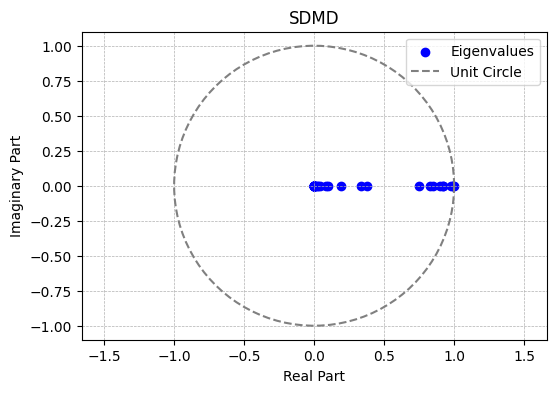

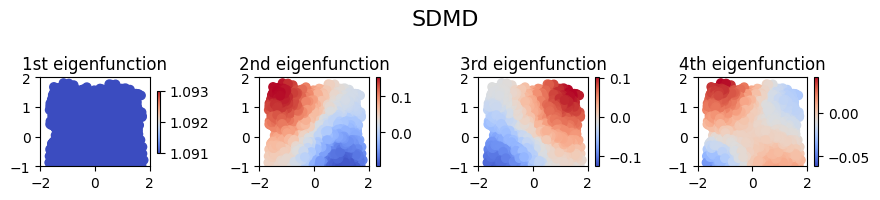


Constructing Generator Inverse for KSWGD...
  - eigvals_K_sdmd shape: (50,)
  - eigvecs_K_sdmd shape: (9999, 50)


In [18]:
# ============================================================
# SDMD: Stochastic Dynamic Mode Decomposition with Dictionary Learning
# ============================================================

torch.cuda.empty_cache()
# import torch.nn.functional as F
# from numpy import linalg as la
# from numpy import *
import solver_sdmd_torch_gpu
from solver_sdmd_torch_gpu import KoopmanNNTorch, KoopmanSolverTorch

print(torch.__version__, torch.cuda.is_available())
print(torch.version.cuda)

# GPU was already selected in Cell 2 - just verify and use it
# device_compute and device were set at the beginning of the notebook
print(f"Using pre-selected GPU: {device_compute}")
if best_gpu_idx >= 0:
    print(f"  GPU Name: {torch.cuda.get_device_name(best_gpu_idx)}")

# CRITICAL: Override the module's global device variable to use our selected GPU
solver_sdmd_torch_gpu.device = device
print(f"Set solver_sdmd_torch_gpu.device = {solver_sdmd_torch_gpu.device}")

# Reshape data_X and data_Y into a single column
X = X_tar  # 2D features
Y = X_tar_next  # 2D targets
print(f"Shape of X: {X.shape}")
print(f"Shape of Y: {Y.shape}")

# Separate data into two parts: train and validation
len_all = X.shape[0]
data_x_train = X[:int(0.7*len_all)]
data_x_valid = X[int(0.7*len_all)+1:]

data_y_train = Y[:int(0.7*len_all)]
data_y_valid = Y[int(0.7*len_all)+1:]

data_train = [data_x_train, data_y_train]
data_valid = [data_x_valid, data_y_valid]

print(data_x_train.shape)



#### SDMD Test ####
checkpoint_file= 'quadruple_well_2d_example_ckpt001.torch'

basis_function = KoopmanNNTorch(input_size= 2, layer_sizes=[50,50], n_psi_train=47).to(device)  # basis number would be 80


solver = KoopmanSolverTorch(dic=basis_function, # Replace 'koopman_nn' by 'dic' if you use the original solver_edmdvar
                       target_dim=np.shape(data_x_train)[-1],
                                                   reg=0.1,  checkpoint_file= checkpoint_file, fnn_checkpoint_file= 'example_fnn001.torch', 
                            a_b_file= 'a_b_example_quadruple_well.jbl', 
                        generator_batch_size= 2, fnn_batch_size= 32, delta_t= dt)

solver.build_with_generator(
    data_train=data_train,
    data_valid=data_valid,
    epochs=6,
    batch_size=256,
    lr=1e-5,
    log_interval=10,
    lr_decay_factor=.8
    )

# Results from solver_edmd/solver_resdmd
evalues_sdmd = solver.eigenvalues.T
efuns_sdmd = solver.eigenfunctions(X)
evectors_sdmd = solver.eigenvectors.T
# kpm_modes = solver.compute_mode().T
N_dict_sdmd = np.shape(evalues_sdmd)[0]
Psi_X_sdmd = solver.get_Psi_X()
Psi_Y_sdmd = solver.get_Psi_Y()
Koopman_matrix_K_sdmd = solver.K

outputs_sdmd = {
    'efuns': efuns_sdmd,
    'evalues': evalues_sdmd,
    'evectors': evectors_sdmd,
    # 'kpm_modes': kpm_modes,
    'N_dict': N_dict_sdmd,
    'K': Koopman_matrix_K_sdmd,
    # 'Psi_X': Psi_X_sdmd,
    # 'Psi_Y': Psi_Y_sdmd,
    }


# ============================================================
# Visualization: Eigenvalues on Unit Circle
# ============================================================

# Assuming 'efuns_sdmd' is a 2D numpy array with shape (n_samples, n_eigenfunctions)
# and 'X' is a 2D numpy array with shape (n_samples, 2) representing your input data

# Assuming evalues_sdmd is a numpy array of complex numbers
print("SDMD eigenvalues shape", evalues_sdmd.shape)
print("SDMD eigenvalues", evalues_sdmd)
print("SDMD eigenvectors shape", evectors_sdmd.shape)
print("SDMD eigenvectors", evectors_sdmd)

# Plot eigenvalues on unit circle
real_parts = evalues_sdmd.real
imag_parts = evalues_sdmd.imag

# Create the plot
plt.figure(figsize=(6, 4))
plt.scatter(real_parts, imag_parts, color='blue', label='Eigenvalues')

# Draw a unit circle for reference
theta = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(theta), np.sin(theta), linestyle='--', color='grey', label='Unit Circle')

plt.title('SDMD')
plt.xlabel('Real Part')
plt.ylabel('Imaginary Part')
plt.axis('equal')  # Ensure the aspect ratio is equal to make the unit circle round
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(loc='upper right')
plt.show()

# Plot eigenfunctions
fig, axs = plt.subplots(1, 4, figsize=(9, 2))

# Plot for the 1st eigenfunction
# scatter1 = axs[0].scatter(*X.T, c=np.real(efuns_sdmd)[:, 0], cmap='coolwarm')
scatter1 = axs[0].scatter(*X.T, c=np.real(efuns_sdmd)[:, 0], cmap='coolwarm', vmin=1.091, vmax=1.093)
axs[0].set_title('1st eigenfunction')
axs[0].set_xlim(-2, 2)
axs[0].set_ylim(-1, 2)
cbar1 = fig.colorbar(scatter1, ax=axs[0], shrink=0.7, aspect=20)

# Plot for the 2nd eigenfunction
scatter2 = axs[1].scatter(*X.T, c=np.real(efuns_sdmd)[:, 1], cmap='coolwarm')
axs[1].set_title('2nd eigenfunction')
axs[1].set_xlim(-2, 2)
axs[1].set_ylim(-1, 2)
cbar2 = fig.colorbar(scatter2, ax=axs[1])

# Plot for the 3rd eigenfunction
scatter3 = axs[2].scatter(*X.T, c=np.real(efuns_sdmd)[:, 2], cmap='coolwarm')
axs[2].set_title('3rd eigenfunction')
axs[2].set_xlim(-2, 2)
axs[2].set_ylim(-1, 2)
cbar3 = fig.colorbar(scatter3, ax=axs[2])

# Plot for the 4th eigenfunction
scatter4 = axs[3].scatter(*X.T, c=np.real(efuns_sdmd)[:, 3], cmap='coolwarm')
axs[3].set_title('4th eigenfunction')
axs[3].set_xlim(-2, 2)
axs[3].set_ylim(-1, 2)
cbar4 = fig.colorbar(scatter4, ax=axs[3])

fig.suptitle('SDMD', fontsize=16)
plt.tight_layout()
plt.show()

# ============================================================
# Construct Generator Eigenvalues and Inverse Weights (for KSWGD)
# ============================================================
print("\n" + "="*60)
print("Constructing Generator Inverse for KSWGD...")
print("="*60)

# Extract real part of eigenvalues (SDMD eigenvalues are already computed)
lambda_ns_sdmd = evalues_sdmd.real

# Construct generator eigenvalues: Î»_gen = (Î»_K - 1) / dt
lambda_gen_sdmd = (lambda_ns_sdmd - 1.0) / dt

# Build inverse generator weights (for KSWGD)
tol_sdmd = 1e-6
lambda_ns_inv_sdmd = np.zeros_like(lambda_ns_sdmd)
mask_sdmd = lambda_ns_sdmd >= tol_sdmd
lambda_ns_inv_sdmd[mask_sdmd] = dt / (lambda_ns_sdmd[mask_sdmd] + 0.001)

# Store results for KSWGD (following DM method naming convention)
eigvals_K_sdmd = lambda_ns_sdmd.copy()
eigvecs_K_sdmd = efuns_sdmd.copy()  # âœ“ Use eigenfunctions (values on data points)!
lambda_gen_full_sdmd = lambda_gen_sdmd.copy()

print(f"  - eigvals_K_sdmd shape: {eigvals_K_sdmd.shape}")
print(f"  - eigvecs_K_sdmd shape: {eigvecs_K_sdmd.shape}")
print("="*60)

## SDMD Analysis: KL Divergence & Boltzmann Sampling

1. Track KL divergence between particle distribution and true Boltzmann distribution during gradient descent
2. Sample from Boltzmann distribution $\pi(x) \propto e^{-V(x)}$ to show spread around well bottoms

In [19]:
# ============================================================
# Koopman(SDMD) Step = n_iter_kswgd
# ============================================================

from matplotlib.patches import Circle

print("="*60)
print(f"Koopman(SDMD): Running {n_iter_kswgd} iterations...")
print("="*60)

# Step 1: Prepare SDMD Koopman spectrum
eigvals_K_sdmd_analysis = eigvals_K_sdmd.copy()
eigvecs_K_sdmd_analysis = eigvecs_K_sdmd.copy()
lambda_gen_sdmd_analysis = lambda_gen_full_sdmd.copy()

# Mode selection (use global eig_threshold and n_skip from Cell 1)
eigvals_after_skip = eigvals_K_sdmd_analysis[n_skip:]

# Use fixed mode count if specified, otherwise use threshold
if k_modes_sdmd_fixed is not None:
    k_modes_sdmd = min(k_modes_sdmd_fixed, len(eigvals_after_skip))  # Don't exceed available modes
    print(f"Using fixed mode count: {k_modes_sdmd}")
else:
    valid_mask = eigvals_after_skip.real > eig_threshold
    k_modes_sdmd = np.sum(valid_mask)
    print(f"Using threshold {eig_threshold}, got {k_modes_sdmd} modes")

mode_start_sdmd = n_skip
mode_end_sdmd = mode_start_sdmd + k_modes_sdmd

print(f"SDMD modes: {k_modes_sdmd} (from {mode_start_sdmd+1} to {mode_end_sdmd})")

# Build inverse generator weights
lambda_gen_selected_sdmd = lambda_gen_sdmd_analysis[mode_start_sdmd:mode_end_sdmd]
tol_gen_sdmd = 1e-6
lambda_gen_inv_selected_sdmd = np.zeros(k_modes_sdmd, dtype=complex)
mask_nonzero_sdmd = np.abs(lambda_gen_selected_sdmd) > tol_gen_sdmd
lambda_gen_inv_selected_sdmd[mask_nonzero_sdmd] = 1.0 / lambda_gen_selected_sdmd[mask_nonzero_sdmd]

# Use global parameters from Cell 1: n_iter_kswgd, h_kswgd, record_interval
n_particles = X_kswgd_init.shape[0]

# Initialize trajectory storage
X_kswgd_traj_sdmd = np.zeros((n_particles, 2, n_iter_kswgd + 1))
X_kswgd_traj_sdmd[:, :, 0] = X_kswgd_init.copy()

# Initialize metrics storage
metrics_sdmd = {
    'steps': [],
    'well_coverage': [],
    'avg_potential': [],
    'movement_rate': []
}

# Step 3: Prepare GPU tensors for SDMD (use float64/complex128 for precision)
eigvecs_selected_sdmd_gpu = torch.from_numpy(eigvecs_K_sdmd_analysis[:, mode_start_sdmd:mode_end_sdmd]).double().to(device_compute)
lambda_gen_inv_selected_sdmd_gpu = torch.from_numpy(lambda_gen_inv_selected_sdmd).to(device_compute).to(torch.complex128)

print(f"GPU tensors prepared for SDMD on: {device_compute}")

# Record initial state
coverage_0, avg_V_0, _ = compute_metrics(X_kswgd_traj_sdmd[:, :, 0])
metrics_sdmd['steps'].append(0)
metrics_sdmd['well_coverage'].append(coverage_0)
metrics_sdmd['avg_potential'].append(avg_V_0)
metrics_sdmd['movement_rate'].append(0.0)

print(f"\n{'='*60}")
print("Running SDMD KSWGD iterations...")
print(f"{'='*60}")

for t in range(n_iter_kswgd):
    X_curr = X_kswgd_traj_sdmd[:, :, t]
    X_curr_gpu = torch.from_numpy(X_curr).double().to(device_compute)
    
    # Evaluate kernel (GPU)
    K_curr_gpu = evaluate_kernel_at_points_gpu(X_curr_gpu, X_tar_gpu, epsilon, p_x_gpu, D_y_gpu)
    
    # Project onto SDMD eigenmodes (GPU, float64/complex128)
    c_gpu = eigvecs_selected_sdmd_gpu.T @ K_curr_gpu.T  # float64 result
    # Convert c_gpu to complex128 for multiplication with complex128 lambda_gen_inv
    c_gpu_complex = c_gpu.to(torch.complex128)
    c_inv_gpu = lambda_gen_inv_selected_sdmd_gpu[:, None] * c_gpu_complex
    f_inv_gpu = eigvecs_selected_sdmd_gpu @ c_inv_gpu.real  # Use real part for final computation
    
    # Compute gradient (GPU)
    grad_K_gpu = compute_kernel_gradient_gpu(X_curr_gpu, X_tar_gpu, epsilon, p_x_gpu)
    
    grad_driving_gpu = torch.zeros((n_particles, 2), dtype=torch.float64, device=device_compute)
    for d_idx in range(2):
        grad_driving_gpu[:, d_idx] = torch.sum(grad_K_gpu[:, :, d_idx] * f_inv_gpu.T, dim=1)
    
    # Update (GPU)
    X_next_gpu = X_curr_gpu - h_kswgd * grad_driving_gpu
    X_kswgd_traj_sdmd[:, :, t+1] = X_next_gpu.cpu().numpy()
    
    # Record metrics
    if (t + 1) % record_interval == 0:
        X_prev = X_kswgd_traj_sdmd[:, :, t]
        X_next = X_kswgd_traj_sdmd[:, :, t+1]
        coverage, avg_V, movement = compute_metrics(X_next, X_prev)
        
        metrics_sdmd['steps'].append(t + 1)
        metrics_sdmd['well_coverage'].append(coverage)
        metrics_sdmd['avg_potential'].append(avg_V)
        metrics_sdmd['movement_rate'].append(movement)
    
    if (t+1) % 500 == 0 or t == 0:
        print(f"\r  [SDMD Step {t+1 if t>0 else 0}]", flush=True)

print()
print("Koopman(SDMD) iteration complete!")

# Convert metrics to numpy arrays
for key in ['steps', 'well_coverage', 'avg_potential', 'movement_rate']:
    metrics_sdmd[key] = np.array(metrics_sdmd[key])

Koopman(SDMD): Running 10000 iterations...
Using fixed mode count: 49
SDMD modes: 49 (from 2 to 50)
GPU tensors prepared for SDMD on: cuda:0

Running SDMD KSWGD iterations...
  [SDMD Step 0]


/tmp/ipykernel_13898/2509105568.py:56: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at /pytorch/aten/src/ATen/native/Copy.cpp:308.)
  eigvecs_selected_sdmd_gpu = torch.from_numpy(eigvecs_K_sdmd_analysis[:, mode_start_sdmd:mode_end_sdmd]).double().to(device_compute)


  [SDMD Step 500]
  [SDMD Step 1000]
  [SDMD Step 1500]
  [SDMD Step 2000]
  [SDMD Step 2500]
  [SDMD Step 3000]
  [SDMD Step 3500]
  [SDMD Step 4000]
  [SDMD Step 4500]
  [SDMD Step 5000]
  [SDMD Step 5500]
  [SDMD Step 6000]
  [SDMD Step 6500]
  [SDMD Step 7000]
  [SDMD Step 7500]
  [SDMD Step 8000]
  [SDMD Step 8500]
  [SDMD Step 9000]
  [SDMD Step 9500]
  [SDMD Step 10000]

Koopman(SDMD) iteration complete!


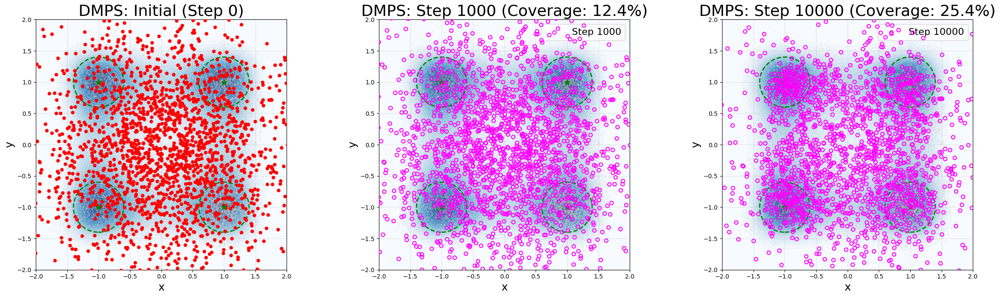

In [20]:
# ============================================================
# Visualization: DMPS at steps 0, 1000, n_iter_kswgd (1x3 layout)
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

# Calculate coverage at step 1000
particles_1000 = X_kswgd_traj_dm[:, :, 1000]
dist_to_wells_1000 = np.min(np.linalg.norm(particles_1000[:, np.newaxis, :] - well_centers[np.newaxis, :, :], axis=2), axis=1)
coverage_1000 = 100.0 * np.sum(dist_to_wells_1000 <= well_radius) / len(particles_1000)

# Subplot 1: Initial particles (step 0)
ax1 = axes[0]
ax1.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
ax1.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2, label='_nolegend_')
ax1.scatter(X_kswgd_traj_dm[:, 0, 0], X_kswgd_traj_dm[:, 1, 0], 
           s=25, c='red', marker='o', label='Initial', zorder=5)

for idx, center in enumerate(well_centers):
    circle = Circle(center, well_radius, fill=False, edgecolor='green', 
                   linewidth=2, linestyle='--', label='_nolegend_')
    ax1.add_patch(circle)

ax1.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', 
           marker='*', zorder=10, label='_nolegend_')
ax1.set_xlabel('x', fontsize=18)
ax1.set_ylabel('y', fontsize=18)
ax1.set_title('DMPS: Initial (Step 0)', fontsize=26)
ax1.set_xlim(-2, 2)
ax1.set_ylim(-2, 2)
ax1.set_aspect('equal')
ax1.grid(True, alpha=0.3)

# Subplot 2: Particles at step 1000
ax2 = axes[1]
ax2.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
ax2.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2, label='_nolegend_')
ax2.scatter(X_kswgd_traj_dm[:, 0, 1000], X_kswgd_traj_dm[:, 1, 1000], 
           s=35, facecolors='none', edgecolors='magenta', linewidth=1.5, 
           label='Step 1000', zorder=15)

for idx, center in enumerate(well_centers):
    circle = Circle(center, well_radius, fill=False, edgecolor='green', 
                   linewidth=2, linestyle='--', label='_nolegend_')
    ax2.add_patch(circle)

ax2.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', 
           marker='*', zorder=10, label='_nolegend_')
ax2.set_xlabel('x', fontsize=18)
ax2.set_ylabel('y', fontsize=18)
ax2.set_title(f'DMPS: Step 1000 (Coverage: {coverage_1000:.1f}%)', fontsize=26)
ax2.set_xlim(-2, 2)
ax2.set_ylim(-2, 2)
ax2.set_aspect('equal')
ax2.legend(loc='upper right', fontsize=16)
ax2.grid(True, alpha=0.3)

# Subplot 3: Final particles at step n_iter_kswgd
ax3 = axes[2]
ax3.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
ax3.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2, label='_nolegend_')
ax3.scatter(X_kswgd_traj_dm[:, 0, n_iter_kswgd], X_kswgd_traj_dm[:, 1, n_iter_kswgd], 
           s=35, facecolors='none', edgecolors='magenta', linewidth=1.5, 
           label=f'Step {n_iter_kswgd}', zorder=15)

for idx, center in enumerate(well_centers):
    circle = Circle(center, well_radius, fill=False, edgecolor='green', 
                   linewidth=2, linestyle='--', label='_nolegend_')
    ax3.add_patch(circle)

ax3.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', 
           marker='*', zorder=10, label='_nolegend_')
ax3.set_xlabel('x', fontsize=18)
ax3.set_ylabel('y', fontsize=18)
ax3.set_title(f'DMPS: Step {n_iter_kswgd} (Coverage: {metrics_dm["well_coverage"][-1]:.1f}%)', fontsize=26)
ax3.set_xlim(-2, 2)
ax3.set_ylim(-2, 2)
ax3.set_aspect('equal')
ax3.legend(loc='upper right', fontsize=16)
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

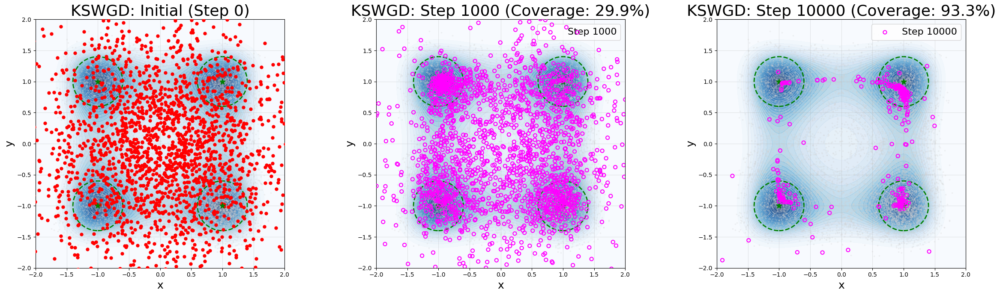

KSWGD Coverage: Step 1000=29.95%, Step 10000=93.30%


In [21]:
# ============================================================
# Visualization: KSWGD at steps 0, 1000, n_iter_kswgd (1x3 layout)
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

# Calculate coverage at step 1000
particles_1000_sdmd = X_kswgd_traj_sdmd[:, :, 1000]
dist_to_wells_1000_sdmd = np.min(np.linalg.norm(particles_1000_sdmd[:, np.newaxis, :] - well_centers[np.newaxis, :, :], axis=2), axis=1)
coverage_1000_sdmd = 100.0 * np.sum(dist_to_wells_1000_sdmd <= well_radius) / len(particles_1000_sdmd)

# Subplot 1: Initial particles (step 0)
ax1 = axes[0]
ax1.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
ax1.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2, label='_nolegend_')
ax1.scatter(X_kswgd_traj_sdmd[:, 0, 0], X_kswgd_traj_sdmd[:, 1, 0], 
           s=25, c='red', marker='o', label='Initial', zorder=5)

for idx, center in enumerate(well_centers):
    circle = Circle(center, well_radius, fill=False, edgecolor='green', 
                   linewidth=2, linestyle='--', label='_nolegend_')
    ax1.add_patch(circle)

ax1.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', 
           marker='*', zorder=10, label='_nolegend_')
ax1.set_xlabel('x', fontsize=18)
ax1.set_ylabel('y', fontsize=18)
ax1.set_title('KSWGD: Initial (Step 0)', fontsize=26)
ax1.set_xlim(-2, 2)
ax1.set_ylim(-2, 2)
ax1.set_aspect('equal')
ax1.grid(True, alpha=0.3)

# Subplot 2: Particles at step 1000
ax2 = axes[1]
ax2.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
ax2.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2, label='_nolegend_')
ax2.scatter(X_kswgd_traj_sdmd[:, 0, 1000], X_kswgd_traj_sdmd[:, 1, 1000], 
           s=35, facecolors='none', edgecolors='magenta', linewidth=1.5, 
           label='Step 1000', zorder=15)

for idx, center in enumerate(well_centers):
    circle = Circle(center, well_radius, fill=False, edgecolor='green', 
                   linewidth=2, linestyle='--', label='_nolegend_')
    ax2.add_patch(circle)

ax2.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', 
           marker='*', zorder=10, label='_nolegend_')
ax2.set_xlabel('x', fontsize=18)
ax2.set_ylabel('y', fontsize=18)
ax2.set_title(f'KSWGD: Step 1000 (Coverage: {coverage_1000_sdmd:.1f}%)', fontsize=26)
ax2.set_xlim(-2, 2)
ax2.set_ylim(-2, 2)
ax2.set_aspect('equal')
ax2.legend(loc='upper right', fontsize=16)
ax2.grid(True, alpha=0.3)

# Subplot 3: Final particles at step n_iter_kswgd
ax3 = axes[2]
ax3.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
ax3.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2, label='_nolegend_')
ax3.scatter(X_kswgd_traj_sdmd[:, 0, n_iter_kswgd], X_kswgd_traj_sdmd[:, 1, n_iter_kswgd], 
           s=35, facecolors='none', edgecolors='magenta', linewidth=1.5, 
           label=f'Step {n_iter_kswgd}', zorder=15)

for idx, center in enumerate(well_centers):
    circle = Circle(center, well_radius, fill=False, edgecolor='green', 
                   linewidth=2, linestyle='--', label='_nolegend_')
    ax3.add_patch(circle)

ax3.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', 
           marker='*', zorder=10, label='_nolegend_')
ax3.set_xlabel('x', fontsize=18)
ax3.set_ylabel('y', fontsize=18)
ax3.set_title(f'KSWGD: Step {n_iter_kswgd} (Coverage: {metrics_sdmd["well_coverage"][-1]:.1f}%)', fontsize=26)
ax3.set_xlim(-2, 2)
ax3.set_ylim(-2, 2)
ax3.set_aspect('equal')
ax3.legend(loc='upper right', fontsize=16)
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"KSWGD Coverage: Step 1000={coverage_1000_sdmd:.2f}%, Step {n_iter_kswgd}={metrics_sdmd['well_coverage'][-1]:.2f}%")

PARTICLE DISTRIBUTION IN BASINS (KSWGD at Step 10000)
Basin 1 Bottom-Left (-1,-1)      :  455 particles ( 22.8%)
Basin 2 Top-Left (-1,+1)         :  531 particles ( 26.6%)
Basin 3 Bottom-Right (+1,-1)     :  569 particles ( 28.4%)
Basin 4 Top-Right (+1,+1)        :  311 particles ( 15.6%)
----------------------------------------------------------------------
Total in basins              : 1866 particles ( 93.3%)
Outside basins               :  134 particles (  6.7%)
Total particles              : 2000 particles


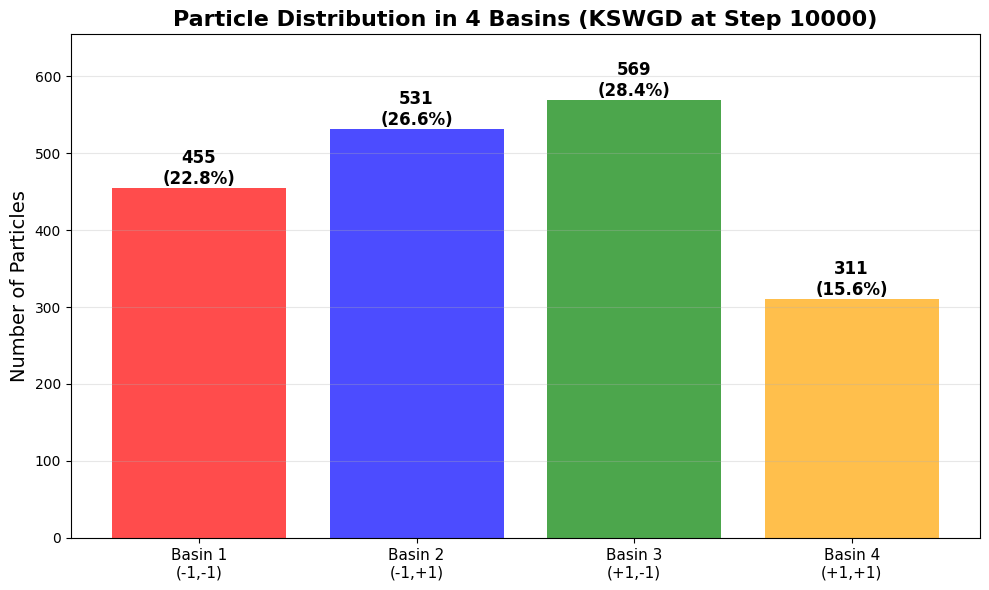

In [22]:
# ============================================================
# Count particles in each basin at final step
# ============================================================

# Basin parameters (already defined earlier)
# well_centers = np.array([[-1.0, -1.0], [-1.0, 1.0], [1.0, -1.0], [1.0, 1.0]])
# well_radius = 0.4

# Get KSWGD particles at final step
particles_final = X_kswgd_traj_sdmd[:, :, n_iter_kswgd]

# Count particles in each basin
basin_labels = ['Bottom-Left (-1,-1)', 'Top-Left (-1,+1)', 'Bottom-Right (+1,-1)', 'Top-Right (+1,+1)']
basin_counts = []

print("="*70)
print(f"PARTICLE DISTRIBUTION IN BASINS (KSWGD at Step {n_iter_kswgd})")
print("="*70)

for i, (center, label) in enumerate(zip(well_centers, basin_labels)):
    # Calculate distance from each particle to this basin center
    distances = np.linalg.norm(particles_final - center, axis=1)
    
    # Count particles within basin radius
    count = np.sum(distances <= well_radius)
    basin_counts.append(count)
    
    percentage = 100.0 * count / len(particles_final)
    print(f"Basin {i+1} {label:25s}: {count:4d} particles ({percentage:5.1f}%)")

# Total particles in any basin
total_in_basins = sum(basin_counts)
total_particles = len(particles_final)
outside_basins = total_particles - total_in_basins

print("-"*70)
print(f"{'Total in basins':29s}: {total_in_basins:4d} particles ({100.0*total_in_basins/total_particles:5.1f}%)")
print(f"{'Outside basins':29s}: {outside_basins:4d} particles ({100.0*outside_basins/total_particles:5.1f}%)")
print(f"{'Total particles':29s}: {total_particles:4d} particles")
print("="*70)

# Visualize as bar chart
fig, ax = plt.subplots(figsize=(10, 6))
x_positions = np.arange(len(basin_labels))
bars = ax.bar(x_positions, basin_counts, color=['red', 'blue', 'green', 'orange'], alpha=0.7)

# Add value labels on bars
for i, (bar, count) in enumerate(zip(bars, basin_counts)):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{count}\n({100.0*count/total_particles:.1f}%)',
            ha='center', va='bottom', fontsize=12, fontweight='bold')

# ax.set_xlabel('Basin', fontsize=14)
ax.set_ylabel('Number of Particles', fontsize=14)
ax.set_title(f'Particle Distribution in 4 Basins (KSWGD at Step {n_iter_kswgd})', fontsize=16, fontweight='bold')
ax.set_xticks(x_positions)
ax.set_xticklabels(['Basin 1\n(-1,-1)', 'Basin 2\n(-1,+1)', 'Basin 3\n(+1,-1)', 'Basin 4\n(+1,+1)'], fontsize=11)
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(0, max(basin_counts) * 1.15)

plt.tight_layout()
plt.show()

In [23]:
# ============================================================
# Parameter Analysis: Key Questions Answered
# ============================================================

print("="*80)
print("KEY PARAMETER ANALYSIS")
print("="*80)

# 1. Training data volume and basis function count
n_samples = X_tar.shape[0]
print(f"\n1. Training Data Size vs Koopman Dictionary Size:")
print(f"   - Training data samples: {n_samples}")
print(f"   - Current dictionary size (N_dict_sdmd): {N_dict_sdmd}")
print(f"   - Data/Dictionary ratio: {n_samples / N_dict_sdmd:.2f}")
print(f"   - Theoretical optimum: Dictionary size ≈ √{n_samples} ≈ {int(np.sqrt(n_samples))}")
print(f"   - Recommendation: Dictionary size 50-200 is reasonable (current: {N_dict_sdmd})")
print(f"   - Current N_dict_sdmd = {N_dict_sdmd} is {'reasonable' if 50 <= N_dict_sdmd <= 200 else 'needs adjustment'}")

# 2. Iteration settings
print(f"\n2. Iteration Settings:")
print(f"   - Total iterations: n_iter_kswgd = {n_iter_kswgd}")
print(f"   - Recording interval: record_interval = {record_interval}")
print(f"   - Total recording points: {n_records}")
print(f"   - Step size: h_kswgd = {h_kswgd}")

# 3. Mode selection method
print(f"\n3. DMPS and Koopman Spectrum Computation Method:")
print(f"   - Method: Threshold-based (NOT fixed truncation)")
print(f"   - DM eigenvalue threshold: eig_threshold = {eig_threshold}")
print(f"   - DM total eigenvalues: {len(eigvals_K_dm)}")
print(f"   - DM skipped modes: n_skip={n_skip} (stationary mode)")
print(f"   - DM retained modes (k_modes): {k_modes}")
print(f"   - SDMD retained modes (k_modes_sdmd): {k_modes_sdmd}")
print(f"   - Note: Retains all eigenvalues with real part > {eig_threshold}, not fixed truncation")

# 4. Gaussian initialization
print(f"\n4. Gaussian Initialization Parameters:")
print(f"   - Initial sampling count: n_init_particles = {n_init_particles}")
print(f"   - Gaussian distribution mean: gaussian_mean = {gaussian_mean}")
print(f"   - Gaussian distribution std: gaussian_std = {gaussian_std}")
print(f"   - Filtered particle count (X_kswgd_init): {X_kswgd_init.shape[0]}")
print(f"   - Variable controlling particle count: n_init_particles (current = {n_init_particles})")
print(f"   - Variable controlling distribution range: gaussian_std (current = {gaussian_std})")
print(f"   - Actual particles used ≈ {100 * X_kswgd_init.shape[0] / n_init_particles:.1f}% of initial sampling")

# 5. Other important parameters
print(f"\n5. Other Key Parameters:")
print(f"   - Kernel bandwidth: epsilon = {epsilon:.6f}")
print(f"   - Well radius: well_radius = {well_radius}")
print(f"   - Number of wells: {len(well_centers)}")

# 6. Data/Dictionary ratio analysis
print(f"\n6. Basis Function Count Recommendations:")
print(f"   - Current data volume: {n_samples} samples")
print(f"   - Optimal basis function count (√n): {int(np.sqrt(n_samples))}")
print(f"   - Safe range (0.5√n ~ 2√n): {int(0.5*np.sqrt(n_samples))} ~ {int(2*np.sqrt(n_samples))}")
data_ratio = n_samples / N_dict_sdmd
if data_ratio < 50:
    print(f"   ⚠️ WARNING: Data/Dict ratio = {data_ratio:.1f} < 50, possible overfitting! Recommend reducing dictionary size")
elif data_ratio > 200:
    print(f"   ✓ Data/Dict ratio = {data_ratio:.1f} > 200, very safe but may underfit")
else:
    print(f"   ✓ Data/Dict ratio = {data_ratio:.1f} is in reasonable range")

print("="*80)

KEY PARAMETER ANALYSIS

1. Training Data Size vs Koopman Dictionary Size:
   - Training data samples: 9999
   - Current dictionary size (N_dict_sdmd): 50
   - Data/Dictionary ratio: 199.98
   - Theoretical optimum: Dictionary size ≈ √9999 ≈ 99
   - Recommendation: Dictionary size 50-200 is reasonable (current: 50)
   - Current N_dict_sdmd = 50 is reasonable

2. Iteration Settings:
   - Total iterations: n_iter_kswgd = 10000
   - Recording interval: record_interval = 100
   - Total recording points: 101
   - Step size: h_kswgd = 0.02

3. DMPS and Koopman Spectrum Computation Method:
   - Method: Threshold-based (NOT fixed truncation)
   - DM eigenvalue threshold: eig_threshold = 0.001
   - DM total eigenvalues: 501
   - DM skipped modes: n_skip=1 (stationary mode)
   - DM retained modes (k_modes): 480
   - SDMD retained modes (k_modes_sdmd): 49
   - Note: Retains all eigenvalues with real part > 0.001, not fixed truncation

4. Gaussian Initialization Parameters:
   - Initial sampling co

Computing KDE for training data...
Computing true Boltzmann distribution...
Computing KDE for KSWGD (step 10000)...
Computing KDE for DMPS (step 10000)...


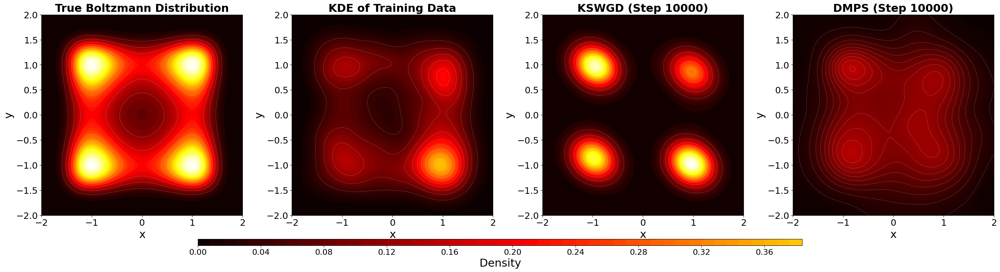


DENSITY STATISTICS (KDE)

KDE Bandwidth (Scott's rule):
  - Training Data: 0.215447
  - KSWGD:         0.281727
  - DMPS:           0.281727

Training Data (Time Series):
  - Max density: 0.3763
  - Mean density: 0.0612
  - Samples: 9999

True Boltzmann Distribution:
  - Max density: 0.2575
  - Mean density: 0.0615

KSWGD (Step 10000):
  - Max density: 0.5743
  - Mean density: 0.0594
  - Particles: 2000

DMPS (Step 10000):
  - Max density: 0.1514
  - Mean density: 0.0568
  - Particles: 2000


In [24]:
# ============================================================
# Density Heat Map Comparison: Training Data vs Boltzmann vs KSWGD vs DMPS
# Using KDE (Kernel Density Estimation) for smooth density visualization
# ============================================================

from scipy.stats import gaussian_kde

# Create evaluation grid
n_grid_kde = 100
x_eval = np.linspace(-2, 2, n_grid_kde)
y_eval = np.linspace(-2, 2, n_grid_kde)
X_eval, Y_eval = np.meshgrid(x_eval, y_eval)
positions = np.vstack([X_eval.ravel(), Y_eval.ravel()])

# ============================================================
# 1. KDE for Training Data (X_tar - time series trajectory)
# ============================================================
print("Computing KDE for training data...")
kde_train = gaussian_kde(X_tar.T, bw_method='scott')
density_train = kde_train(positions).reshape(n_grid_kde, n_grid_kde)

# ============================================================
# 2. True Boltzmann Distribution (analytical)
# ============================================================
print("Computing true Boltzmann distribution...")
density_boltzmann = potential.stationary_density(X_eval, Y_eval)

# ============================================================
# 3. KDE for KSWGD particles at final step
# ============================================================
print(f"Computing KDE for KSWGD (step {n_iter_kswgd})...")
X_kswgd_final = X_kswgd_traj_sdmd[:, :, n_iter_kswgd]

# Check if particles are degenerate (collapsed to a point)
if X_kswgd_final.shape[0] < 2:
    print("  WARNING: Too few particles for KDE, using uniform density")
    density_kswgd = np.ones((n_grid_kde, n_grid_kde)) * 0.01
elif np.std(X_kswgd_final) < 1e-6:
    print("  WARNING: Particles collapsed to a point, using uniform density")
    density_kswgd = np.ones((n_grid_kde, n_grid_kde)) * 0.01
else:
    try:
        kde_kswgd = gaussian_kde(X_kswgd_final.T, bw_method='scott')
        density_kswgd = kde_kswgd(positions).reshape(n_grid_kde, n_grid_kde)
    except np.linalg.LinAlgError:
        print("  WARNING: Singular covariance matrix, adding small noise")
        X_kswgd_noisy = X_kswgd_final + np.random.randn(*X_kswgd_final.shape) * 1e-4
        kde_kswgd = gaussian_kde(X_kswgd_noisy.T, bw_method='scott')
        density_kswgd = kde_kswgd(positions).reshape(n_grid_kde, n_grid_kde)

# ============================================================
# 4. KDE for DMPS particles at final step
# ============================================================
print(f"Computing KDE for DMPS (step {n_iter_kswgd})...")
X_dmps_final = X_kswgd_traj_dm[:, :, n_iter_kswgd]

# Check if particles are degenerate (collapsed to a point)
if X_dmps_final.shape[0] < 2:
    print("  WARNING: Too few particles for KDE, using uniform density")
    density_dmps = np.ones((n_grid_kde, n_grid_kde)) * 0.01
elif np.std(X_dmps_final) < 1e-6:
    print("  WARNING: Particles collapsed to a point, using uniform density")
    density_dmps = np.ones((n_grid_kde, n_grid_kde)) * 0.01
else:
    try:
        kde_dmps = gaussian_kde(X_dmps_final.T, bw_method='scott')
        density_dmps = kde_dmps(positions).reshape(n_grid_kde, n_grid_kde)
    except np.linalg.LinAlgError:
        print("  WARNING: Singular covariance matrix, adding small noise")
        X_dmps_noisy = X_dmps_final + np.random.randn(*X_dmps_final.shape) * 1e-4
        kde_dmps = gaussian_kde(X_dmps_noisy.T, bw_method='scott')
        density_dmps = kde_dmps(positions).reshape(n_grid_kde, n_grid_kde)

# ============================================================
# Visualization: 4 Heat Maps (1x4 row)
# ============================================================

fig, axes = plt.subplots(1, 4, figsize=(28, 7))

# Common colorbar range for fair comparison (excluding Boltzmann which has different scale)
vmin_kde = 0
vmax_kde = max(density_train.max(), density_dmps.max(), density_kswgd.max())

# ----- Plot 1: True Boltzmann Distribution (moved to first position) -----
ax1 = axes[0]
im1_boltz = ax1.contourf(X_eval, Y_eval, density_boltzmann, levels=50, cmap='hot')
ax1.contour(X_eval, Y_eval, density_boltzmann, levels=10, colors='white', alpha=0.3, linewidths=0.5)
ax1.set_xlabel('x', fontsize=22)
ax1.set_ylabel('y', fontsize=22)
ax1.set_title('True Boltzmann Distribution', fontsize=22, fontweight='bold')
ax1.set_xlim(-2, 2)
ax1.set_ylim(-2, 2)
ax1.set_aspect('equal')
ax1.tick_params(axis='both', labelsize=18)

# ----- Plot 2: Training Data (moved to second position) -----
ax2 = axes[1]
im2 = ax2.contourf(X_eval, Y_eval, density_train, levels=50, cmap='hot', vmin=vmin_kde, vmax=vmax_kde)
ax2.contour(X_eval, Y_eval, density_train, levels=10, colors='white', alpha=0.3, linewidths=0.5)
ax2.set_xlabel('x', fontsize=22)
ax2.set_ylabel('y', fontsize=22)
ax2.set_title('KDE of Training Data', fontsize=22, fontweight='bold')
ax2.set_xlim(-2, 2)
ax2.set_ylim(-2, 2)
ax2.set_aspect('equal')
ax2.tick_params(axis='both', labelsize=18)

# ----- Plot 3: KSWGD at final step -----
ax3 = axes[2]
im3 = ax3.contourf(X_eval, Y_eval, density_kswgd, levels=50, cmap='hot', vmin=vmin_kde, vmax=vmax_kde)
ax3.contour(X_eval, Y_eval, density_kswgd, levels=10, colors='white', alpha=0.3, linewidths=0.5)
ax3.set_xlabel('x', fontsize=22)
ax3.set_ylabel('y', fontsize=22)
ax3.set_title(f'KSWGD (Step {n_iter_kswgd})', fontsize=22, fontweight='bold')
ax3.set_xlim(-2, 2)
ax3.set_ylim(-2, 2)
ax3.set_aspect('equal')
ax3.tick_params(axis='both', labelsize=18)

# ----- Plot 4: DMPS at final step -----
ax4 = axes[3]
im4 = ax4.contourf(X_eval, Y_eval, density_dmps, levels=50, cmap='hot', vmin=vmin_kde, vmax=vmax_kde)
ax4.contour(X_eval, Y_eval, density_dmps, levels=10, colors='white', alpha=0.3, linewidths=0.5)
ax4.set_xlabel('x', fontsize=22)
ax4.set_ylabel('y', fontsize=22)
ax4.set_title(f'DMPS (Step {n_iter_kswgd})', fontsize=22, fontweight='bold')
ax4.set_xlim(-2, 2)
ax4.set_ylim(-2, 2)
ax4.set_aspect('equal')
ax4.tick_params(axis='both', labelsize=18)

# Add shared colorbar for all 4 plots (bottom, centered)
plt.tight_layout()
plt.subplots_adjust(bottom=0.18)
cbar_ax = fig.add_axes([0.2, 0.06, 0.6, 0.025])  # [left, bottom, width, height] - centered under all 4 plots
cbar = fig.colorbar(im2, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Density', fontsize=22)
cbar.ax.tick_params(labelsize=16)

plt.show()

# ============================================================
# Print Statistics
# ============================================================
print("\n" + "="*70)
print("DENSITY STATISTICS (KDE)")
print("="*70)

# Print bandwidth information
print(f"\nKDE Bandwidth (Scott's rule):")
print(f"  - Training Data: {kde_train.factor:.6f}")
print(f"  - KSWGD:         {kde_kswgd.factor:.6f}")
print(f"  - DMPS:           {kde_dmps.factor:.6f}")

print(f"\nTraining Data (Time Series):")
print(f"  - Max density: {density_train.max():.4f}")
print(f"  - Mean density: {density_train.mean():.4f}")
print(f"  - Samples: {X_tar.shape[0]}")

print(f"\nTrue Boltzmann Distribution:")
print(f"  - Max density: {density_boltzmann.max():.4f}")
print(f"  - Mean density: {density_boltzmann.mean():.4f}")

print(f"\nKSWGD (Step {n_iter_kswgd}):")
print(f"  - Max density: {density_kswgd.max():.4f}")
print(f"  - Mean density: {density_kswgd.mean():.4f}")
print(f"  - Particles: {X_kswgd_final.shape[0]}")

print(f"\nDMPS (Step {n_iter_kswgd}):")
print(f"  - Max density: {density_dmps.max():.4f}")
print(f"  - Mean density: {density_dmps.mean():.4f}")
print(f"  - Particles: {X_dmps_final.shape[0]}")
print("="*70)

## Convergence Comparison: DMPS vs Koopman(SDMD)

Visualize convergence metrics over iterations to compare the two methods

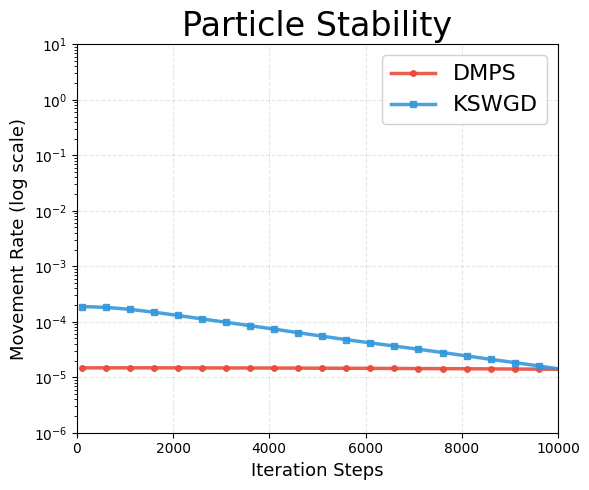


CONVERGENCE ANALYSIS SUMMARY

 AT 1000 STEPS:
----------------------------------------------------------------------

DMPS:
  • Well Coverage:    12.40%
  • Avg Potential:    4.3413
  • Movement Rate:    0.000015

Koopman(SDMD):
  • Well Coverage:    29.95%
  • Avg Potential:    3.5428
  • Movement Rate:    0.000170

 AT 10000 STEPS (FINAL):
----------------------------------------------------------------------

DMPS:
  • Well Coverage:    25.40%
  • Avg Potential:    3.5654
  • Movement Rate:    0.000014

Koopman(SDMD):
  • Well Coverage:    93.30%
  • Avg Potential:    1.7966
  • Movement Rate:    0.000014

CONVERGENCE DETECTION

Criteria: Coverage ≥ 95.0% AND Movement ≤ 0.01
----------------------------------------------------------------------

DMPS: NOT fully converged by step 10000
  • Final Coverage:   25.40% (target: ≥95.0%)
  • Final Movement:   0.000014 (target: ≤0.01)

Koopman(SDMD): NOT fully converged by step 10000
  • Final Coverage:   93.30% (target: ≥95.0%)
  • Final M

In [25]:
# ============================================================
# Convergence Comparison Visualization: Movement Rate
# ============================================================

fig, ax3 = plt.subplots(1, 1, figsize=(6, 5))

# Color scheme
color_dm = '#E74C3C'      # Red for DMPS
color_sdmd = '#3498DB'    # Blue for Koopman(SDMD)

# ========== Movement Rate (Displacement per Step) ==========

ax3.plot(metrics_dm['steps'][1:], metrics_dm['movement_rate'][1:],  # Skip step 0 (movement=0)
         color=color_dm, linewidth=2.5, marker='o', markersize=4, 
         markevery=5, label='DMPS', alpha=0.9)

ax3.plot(metrics_sdmd['steps'][1:], metrics_sdmd['movement_rate'][1:], 
         color=color_sdmd, linewidth=2.5, marker='s', markersize=4, 
         markevery=5, label='KSWGD', alpha=0.9)

# # Mark 1000 steps
# ax3.axvline(x=1000, color='gray', linestyle='--', linewidth=1, alpha=0.5)
# ax3.text(1000, ax3.get_ylim()[1] * 0.95, '1000 steps', 
#          ha='center', va='top', fontsize=9, color='gray')

ax3.set_xlabel('Iteration Steps', fontsize=13)
ax3.set_ylabel('Movement Rate (log scale)', fontsize=13)
ax3.set_title('Particle Stability', fontsize=24)
ax3.set_xlim(0, n_iter_kswgd)
ax3.set_yscale('log')  # Use log scale to show small changes
ax3.set_ylim(1e-6, 1e1)  # Fixed Y-axis range to reduce visual emphasis on differences
ax3.grid(True, alpha=0.3, linestyle='--')
ax3.legend(loc='upper right', fontsize=16, framealpha=0.9)

plt.tight_layout()
plt.show()

# ============================================================
# Print Convergence Analysis Summary
# ============================================================

print("\n" + "="*70)
print("CONVERGENCE ANALYSIS SUMMARY")
print("="*70)

print("\n AT 1000 STEPS:")
print("-" * 70)
idx_1000 = 10  # Step 1000 is at index 10 (0, 100, 200, ..., 1000)

print(f"\nDMPS:")
print(f"  • Well Coverage:    {metrics_dm['well_coverage'][idx_1000]:.2f}%")
print(f"  • Avg Potential:    {metrics_dm['avg_potential'][idx_1000]:.4f}")
print(f"  • Movement Rate:    {metrics_dm['movement_rate'][idx_1000]:.6f}")

print(f"\nKoopman(SDMD):")
print(f"  • Well Coverage:    {metrics_sdmd['well_coverage'][idx_1000]:.2f}%")
print(f"  • Avg Potential:    {metrics_sdmd['avg_potential'][idx_1000]:.4f}")
print(f"  • Movement Rate:    {metrics_sdmd['movement_rate'][idx_1000]:.6f}")

print(f"\n AT {n_iter_kswgd} STEPS (FINAL):")
print("-" * 70)

print(f"\nDMPS:")
print(f"  • Well Coverage:    {metrics_dm['well_coverage'][-1]:.2f}%")
print(f"  • Avg Potential:    {metrics_dm['avg_potential'][-1]:.4f}")
print(f"  • Movement Rate:    {metrics_dm['movement_rate'][-1]:.6f}")

print(f"\nKoopman(SDMD):")
print(f"  • Well Coverage:    {metrics_sdmd['well_coverage'][-1]:.2f}%")
print(f"  • Avg Potential:    {metrics_sdmd['avg_potential'][-1]:.4f}")
print(f"  • Movement Rate:    {metrics_sdmd['movement_rate'][-1]:.6f}")

# ============================================================
# Convergence Detection
# ============================================================

print("\n" + "="*70)
print("CONVERGENCE DETECTION")
print("="*70)

# Define convergence criteria
coverage_threshold = 95.0  # 95% particles in wells
movement_threshold = 0.01  # Very small movement

def detect_convergence(metrics_dict, coverage_thresh=95.0, movement_thresh=0.01):
    """Detect first step where convergence criteria are met"""
    steps = metrics_dict['steps']
    coverage = metrics_dict['well_coverage']
    movement = metrics_dict['movement_rate']
    
    for i in range(1, len(steps)):  # Start from 1 to skip initial step
        if coverage[i] >= coverage_thresh and movement[i] <= movement_thresh:
            return steps[i], i
    return None, None

conv_step_dm, conv_idx_dm = detect_convergence(metrics_dm, coverage_threshold, movement_threshold)
conv_step_sdmd, conv_idx_sdmd = detect_convergence(metrics_sdmd, coverage_threshold, movement_threshold)

print(f"\nCriteria: Coverage ≥ {coverage_threshold}% AND Movement ≤ {movement_threshold}")
print("-" * 70)

if conv_step_dm is not None:
    print(f"\nDMPS converged at step: {conv_step_dm}")
    print(f"  • Well Coverage:    {metrics_dm['well_coverage'][conv_idx_dm]:.2f}%")
    print(f"  • Movement Rate:    {metrics_dm['movement_rate'][conv_idx_dm]:.6f}")
else:
    print(f"\nDMPS: NOT fully converged by step {n_iter_kswgd}")
    print(f"  • Final Coverage:   {metrics_dm['well_coverage'][-1]:.2f}% (target: ≥{coverage_threshold}%)")
    print(f"  • Final Movement:   {metrics_dm['movement_rate'][-1]:.6f} (target: ≤{movement_threshold})")

if conv_step_sdmd is not None:
    print(f"\nKoopman(SDMD) converged at step: {conv_step_sdmd}")
    print(f"  • Well Coverage:    {metrics_sdmd['well_coverage'][conv_idx_sdmd]:.2f}%")
    print(f"  • Movement Rate:    {metrics_sdmd['movement_rate'][conv_idx_sdmd]:.6f}")
else:
    print(f"\nKoopman(SDMD): NOT fully converged by step {n_iter_kswgd}")
    print(f"  • Final Coverage:   {metrics_sdmd['well_coverage'][-1]:.2f}% (target: ≥{coverage_threshold}%)")
    print(f"  • Final Movement:   {metrics_sdmd['movement_rate'][-1]:.6f} (target: ≤{movement_threshold})")


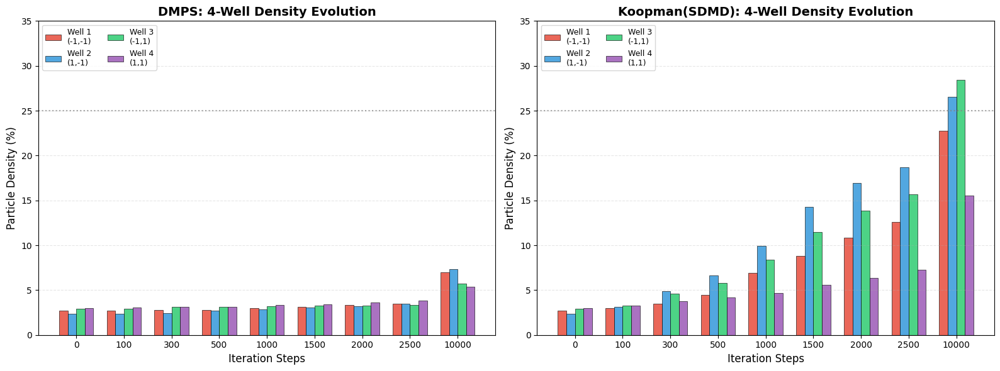


4-Well Density Evolution Summary (% of particles in each well)

Step    Well 1 (DM)   Well 1 (SDMD) Well 2 (DM)   Well 2 (SDMD) Well 3 (DM)   Well 3 (SDMD) Well 4 (DM)   Well 4 (SDMD) 
--------------------------------------------------------------------------------
0       2.7           2.7           2.4           2.4           3.0           3.0           3.0           3.0           
100     2.7           3.0           2.4           3.1           3.0           3.3           3.0           3.2           
300     2.8           3.5           2.5           4.9           3.1           4.6           3.1           3.8           
500     2.8           4.5           2.7           6.7           3.1           5.8           3.1           4.2           
1000    3.0           6.9           2.9           9.9           3.2           8.4           3.4           4.7           
1500    3.1           8.8           3.0           14.2          3.3           11.4          3.4           5.6           
2000   

In [26]:
# ============================================================
# 4-Well Density Evolution Comparison: DMPS vs Koopman(SDMD)
# ============================================================

# Define well labels corresponding to well_centers
well_labels = ['Well 1\n(-1,-1)', 'Well 2\n(1,-1)', 'Well 3\n(-1,1)', 'Well 4\n(1,1)']
well_colors = ['#E74C3C', '#3498DB', '#2ECC71', '#9B59B6']  # Red, Blue, Green, Purple

# Sample time steps to analyze (including 0 and final)
time_steps = [0, 100, 300, 500, 1000, 1500, 2000, 2500, n_iter_kswgd]

# Compute density in each well over time for both methods
def compute_well_densities(X_traj, time_steps, well_centers, well_radius):
    """Compute percentage of particles in each well at given time steps"""
    n_particles = X_traj.shape[0]
    n_wells = len(well_centers)
    n_times = len(time_steps)
    
    densities = np.zeros((n_wells, n_times))
    
    for t_idx, t in enumerate(time_steps):
        X_current = X_traj[:, :, t]
        for w_idx, center in enumerate(well_centers):
            dist = np.linalg.norm(X_current - center, axis=1)
            in_well = dist <= well_radius
            densities[w_idx, t_idx] = 100.0 * np.sum(in_well) / n_particles
    
    return densities

# Compute for both methods
densities_dm = compute_well_densities(X_kswgd_traj_dm, time_steps, well_centers, well_radius)
densities_sdmd = compute_well_densities(X_kswgd_traj_sdmd, time_steps, well_centers, well_radius)

# Create figure with grouped bar chart
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Bar width and positions
n_times = len(time_steps)
n_wells = 4
bar_width = 0.18
x_base = np.arange(n_times)

# Plot 1: DMPS well densities over time
ax1 = axes[0]
for w_idx in range(n_wells):
    offset = (w_idx - 1.5) * bar_width
    bars = ax1.bar(x_base + offset, densities_dm[w_idx], bar_width, 
                   label=well_labels[w_idx], color=well_colors[w_idx], 
                   edgecolor='black', linewidth=0.5, alpha=0.85)
    
ax1.set_xlabel('Iteration Steps', fontsize=12)
ax1.set_ylabel('Particle Density (%)', fontsize=12)
ax1.set_title('DMPS: 4-Well Density Evolution', fontsize=14, fontweight='bold')
ax1.set_xticks(x_base)
ax1.set_xticklabels([str(t) for t in time_steps], fontsize=10)
ax1.legend(loc='upper left', fontsize=9, ncol=2)
ax1.set_ylim(0, 35)
ax1.grid(axis='y', alpha=0.3, linestyle='--')
ax1.axhline(y=25, color='gray', linestyle=':', alpha=0.7, label='Ideal (25%)')

# Plot 2: Koopman(SDMD) well densities over time
ax2 = axes[1]
for w_idx in range(n_wells):
    offset = (w_idx - 1.5) * bar_width
    bars = ax2.bar(x_base + offset, densities_sdmd[w_idx], bar_width, 
                   label=well_labels[w_idx], color=well_colors[w_idx], 
                   edgecolor='black', linewidth=0.5, alpha=0.85)
    
ax2.set_xlabel('Iteration Steps', fontsize=12)
ax2.set_ylabel('Particle Density (%)', fontsize=12)
ax2.set_title('Koopman(SDMD): 4-Well Density Evolution', fontsize=14, fontweight='bold')
ax2.set_xticks(x_base)
ax2.set_xticklabels([str(t) for t in time_steps], fontsize=10)
ax2.legend(loc='upper left', fontsize=9, ncol=2)
ax2.set_ylim(0, 35)
ax2.grid(axis='y', alpha=0.3, linestyle='--')
ax2.axhline(y=25, color='gray', linestyle=':', alpha=0.7, label='Ideal (25%)')

plt.tight_layout()
# plt.savefig('figures/4_well_density_evolution_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

# Print summary table
print("\n" + "="*80)
print("4-Well Density Evolution Summary (% of particles in each well)")
print("="*80)
print(f"\n{'Step':<8}", end='')
for w_idx in range(n_wells):
    print(f"{'Well '+str(w_idx+1)+' (DM)':<14}{'Well '+str(w_idx+1)+' (SDMD)':<14}", end='')
print()
print("-"*80)
for t_idx, t in enumerate(time_steps):
    print(f"{t:<8}", end='')
    for w_idx in range(n_wells):
        print(f"{densities_dm[w_idx, t_idx]:<14.1f}{densities_sdmd[w_idx, t_idx]:<14.1f}", end='')
    print()
print("="*80)
print(f"\nTotal coverage at step {n_iter_kswgd}:")
print(f"  DMPS: {np.sum(densities_dm[:, -1]):.1f}%")
print(f"  Koopman(SDMD): {np.sum(densities_sdmd[:, -1]):.1f}%")

Computing KL Divergence for all methods...

Training Data (X_tar) KL Divergence: 0.1151
  (This serves as a baseline - the best achievable KL)

DMPS KL Divergence:
  Step 0: KL = 0.6871
  Step 500: KL = 0.6662
  Step 1000: KL = 0.6457
  Step 1500: KL = 0.6254
  Step 2000: KL = 0.6055
  Step 2500: KL = 0.5860
  Step 3000: KL = 0.5670
  Step 3500: KL = 0.5484
  Step 4000: KL = 0.5302
  Step 4500: KL = 0.5125
  Step 5000: KL = 0.4952
  Step 5500: KL = 0.4784
  Step 6000: KL = 0.4621
  Step 6500: KL = 0.4462
  Step 7000: KL = 0.4308
  Step 7500: KL = 0.4158
  Step 8000: KL = 0.4013
  Step 8500: KL = 0.3872
  Step 9000: KL = 0.3735
  Step 9500: KL = 0.3603
  Step 10000: KL = 0.3475

KSWGD(SDMD) KL Divergence:
  Step 0: KL = 0.6871
  Step 500: KL = 0.4515
  Step 1000: KL = 0.2964
  Step 1500: KL = 0.2039
  Step 2000: KL = 0.1518
  Step 2500: KL = 0.1277
  Step 3000: KL = 0.1217
  Step 3500: KL = 0.1276
  Step 4000: KL = 0.1401
  Step 4500: KL = 0.1559
  Step 5000: KL = 0.1715
  Step 5500: KL

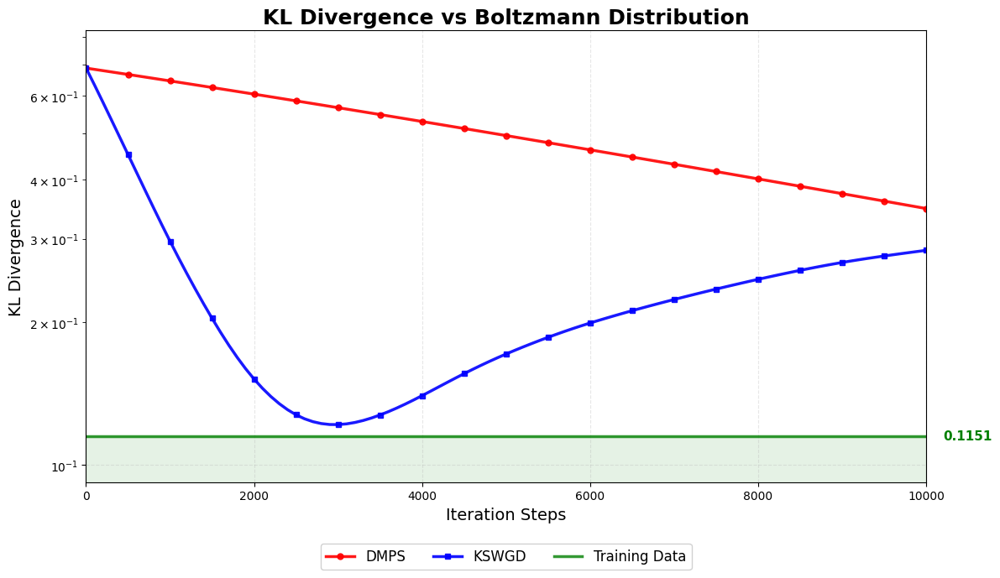


KL Divergence Summary (vs True Boltzmann Distribution):
Method                         Initial KL        Final KL       Reduction
--------------------------------------------------------------------------------
Training Data (X_tar)              0.1151          0.1151      (baseline)
DMPS                               0.6871          0.3475          0.3396
KSWGD(SDMD)                        0.6871          0.2837          0.4034

Note: Training Data KL (0.1151) represents the empirical baseline.
      Lower KL = closer to true Boltzmann distribution π(x) ∝ exp(-V(x))


In [27]:
# ============================================================
# KL Divergence Analysis: Training Data vs DMPS vs KSWGD(SDMD)
# ============================================================

print("="*60)
print("Computing KL Divergence for all methods...")
print("="*60)

# Sample iterations to evaluate (every 100 steps)
eval_steps = list(range(0, n_iter_kswgd + 1, 100))

# Compute KL divergence for Training Data (X_tar) as baseline
# This is a constant value representing how well the training data matches the true Boltzmann distribution
kl_training_data = compute_kl_divergence_kde(X_tar, potential)
print(f"\nTraining Data (X_tar) KL Divergence: {kl_training_data:.4f}")
print("  (This serves as a baseline - the best achievable KL)")

# Compute KL divergence for DMPS
kl_history_dm = []
print("\nDMPS KL Divergence:")
for t in eval_steps:
    particles_t = X_kswgd_traj_dm[:, :, t]
    kl_t = compute_kl_divergence_kde(particles_t, potential)
    kl_history_dm.append(kl_t)
    if t % 500 == 0:
        print(f"  Step {t}: KL = {kl_t:.4f}")

# Compute KL divergence for KSWGD(SDMD)
kl_history_sdmd = []
print("\nKSWGD(SDMD) KL Divergence:")
for t in eval_steps:
    particles_t = X_kswgd_traj_sdmd[:, :, t]
    kl_t = compute_kl_divergence_kde(particles_t, potential)
    kl_history_sdmd.append(kl_t)
    if t % 500 == 0:
        print(f"  Step {t}: KL = {kl_t:.4f}")

# ============================================================
# Visualization: KL Divergence Comparison (3 methods)
# ============================================================

fig, ax = plt.subplots(figsize=(12, 7))

# Plot DMPS and KSWGD
ax.plot(eval_steps, kl_history_dm, 'r-o', linewidth=2.5, markersize=5, 
        markevery=5, label='DMPS', alpha=0.9)
ax.plot(eval_steps, kl_history_sdmd, 'b-s', linewidth=2.5, markersize=5, 
        markevery=5, label='KSWGD', alpha=0.9)

# Plot Training Data baseline as horizontal line (no KL value in legend)
ax.axhline(y=kl_training_data, color='green', linestyle='-', linewidth=2.5, 
           label='Training Data', alpha=0.8)

# Add shaded region below the training data baseline
ax.fill_between(eval_steps, 0, kl_training_data, color='green', alpha=0.1)

# # Mark 1000 steps
# ax.axvline(x=1000, color='gray', linestyle='--', linewidth=1.5, alpha=0.6)
# ax.text(1050, ax.get_ylim()[1] * 0.5, '1000 steps', 
#         ha='left', va='center', fontsize=10, color='gray', rotation=90)

ax.set_xlabel('Iteration Steps', fontsize=14)
ax.set_ylabel('KL Divergence', fontsize=14)
ax.set_title('KL Divergence vs Boltzmann Distribution', fontsize=18, fontweight='bold')
ax.set_xlim(0, n_iter_kswgd)
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.12), 
          ncol=3, framealpha=0.9, fancybox=True)
ax.set_yscale('log')

# Set y-axis limits to show more range and add minor ticks
ymin = min(min(kl_history_dm), min(kl_history_sdmd), kl_training_data) * 0.8
ymax = max(max(kl_history_dm), max(kl_history_sdmd)) * 1.2
ax.set_ylim(ymin, ymax)

# Add more y-axis ticks using LogLocator
from matplotlib.ticker import LogLocator, LogFormatterSciNotation
ax.yaxis.set_major_locator(LogLocator(base=10.0, numticks=10))
ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10) * 0.1, numticks=10))
ax.tick_params(axis='y', which='minor', length=3)

# Add Training Data KL value annotation on the y-axis (right side)
ax.annotate(f'{kl_training_data:.4f}', 
            xy=(n_iter_kswgd, kl_training_data), 
            xytext=(n_iter_kswgd * 1.02, kl_training_data),
            fontsize=11, color='green', fontweight='bold',
            va='center', ha='left',
            annotation_clip=False)

plt.tight_layout()
plt.show()

# Print summary
print("\n" + "="*80)
print("KL Divergence Summary (vs True Boltzmann Distribution):")
print("="*80)
print(f"{'Method':<25} {'Initial KL':>15} {'Final KL':>15} {'Reduction':>15}")
print("-"*80)
print(f"{'Training Data (X_tar)':<25} {kl_training_data:>15.4f} {kl_training_data:>15.4f} {'(baseline)':>15}")
print(f"{'DMPS':<25} {kl_history_dm[0]:>15.4f} {kl_history_dm[-1]:>15.4f} {kl_history_dm[0]-kl_history_dm[-1]:>15.4f}")
print(f"{'KSWGD(SDMD)':<25} {kl_history_sdmd[0]:>15.4f} {kl_history_sdmd[-1]:>15.4f} {kl_history_sdmd[0]-kl_history_sdmd[-1]:>15.4f}")
print("="*80)
print(f"\nNote: Training Data KL ({kl_training_data:.4f}) represents the empirical baseline.")
print(f"      Lower KL = closer to true Boltzmann distribution π(x) ∝ exp(-V(x))")
if kl_history_dm[-1] < kl_training_data:
    print(f"\n✓ DMPS final KL ({kl_history_dm[-1]:.4f}) is BETTER than training data!")
if kl_history_sdmd[-1] < kl_training_data:
    print(f"✓ KSWGD final KL ({kl_history_sdmd[-1]:.4f}) is BETTER than training data!")

## Key Simulation Parameters Summary

This table summarizes the most important parameters used in the simulation:

| Parameter | Variable Name | Value | Description |
|-----------|--------------|-------|-------------|
| **Initialization** | | | |
| Initial particle count | `n_init_particles` | - | Number of particles sampled initially |
| Gaussian mean | `gaussian_mean` | [0, 0] | Center of Gaussian distribution |
| Gaussian std | `gaussian_std` | - | Standard deviation of Gaussian |
| Filtered particle count | `X_kswgd_init.shape[0]` | - | Particles after filtering (outside wells) |
| **Iteration Settings** | | | |
| Total iterations | `n_iter_kswgd` | - | Total gradient descent steps |
| Step size | `h_kswgd` | - | Gradient descent step size |
| Recording interval | `record_interval` | 100 | Steps between metric recordings |
| **Spectral Settings** | | | |
| Eigenvalue threshold | `eig_threshold` | 0.01 | Threshold for mode selection |
| DM modes retained | `k_modes` | - | Number of diffusion map modes |
| SDMD modes retained | `k_modes_sdmd` | - | Number of Koopman modes |
| **Dictionary Settings** | | | |
| Training samples | `n_samples` | - | Number of training data points |
| Dictionary size | `N_dict_sdmd` | - | Neural network dictionary basis count |
| Data/Dict ratio | `n_samples/N_dict_sdmd` | - | Determines overfitting risk |

In [28]:
# ============================================================
# Print Key Simulation Parameters
# ============================================================

print("="*80)
print("KEY SIMULATION PARAMETERS")
print("="*80)

print("\n1. INITIALIZATION PARAMETERS:")
print("-" * 80)
print(f"   Initial particle count (n_init_particles):     {n_init_particles}")
print(f"   Gaussian distribution mean (gaussian_mean):    {gaussian_mean}")
print(f"   Gaussian distribution std (gaussian_std):      {gaussian_std}")
print(f"   Filtered particle count (X_kswgd_init):        {X_kswgd_init.shape[0]}")
print(f"   Retention rate:                                {100 * X_kswgd_init.shape[0] / n_init_particles:.1f}%")

print("\n2. ITERATION SETTINGS:")
print("-" * 80)
print(f"   Total iterations (n_iter_kswgd):               {n_iter_kswgd}")
print(f"   Step size / learning rate (h_kswgd):           {h_kswgd}")
print(f"   Recording interval (record_interval):          {record_interval}")
print(f"   Total metric recordings:                       {n_records}")

print("\n3. SPECTRAL SETTINGS (MODE SELECTION):")
print("-" * 80)
print(f"   Eigenvalue threshold (eig_threshold):          {eig_threshold}")
print(f"   Mode selection method:                         Threshold-based (NOT truncation)")
print(f"   DM modes retained (k_modes):                   {k_modes}")
print(f"   SDMD modes retained (k_modes_sdmd):            {k_modes_sdmd}")
print(f"   DM skipped modes (n_skip):                     {n_skip} (stationary mode)")

print("\n4. DICTIONARY & DATA SETTINGS:")
print("-" * 80)
print(f"   Training data samples (n_samples):             {n_samples}")
print(f"   Dictionary size (N_dict_sdmd):                 {N_dict_sdmd}")
print(f"   Data/Dictionary ratio:                         {n_samples / N_dict_sdmd:.2f}")
print(f"   Optimal dict size (√n_samples):                ~{int(np.sqrt(n_samples))}")
print(f"   Safe range (0.5√n ~ 2√n):                      {int(0.5*np.sqrt(n_samples))} ~ {int(2*np.sqrt(n_samples))}")

print("\n5. OTHER KEY PARAMETERS:")
print("-" * 80)
print(f"   Kernel bandwidth (epsilon):                    {epsilon:.6f}")
print(f"   Well radius (well_radius):                     {well_radius}")
print(f"   Number of wells:                               {len(well_centers)}")
print(f"   Well centers:                                  {well_centers.tolist()}")

print("\n" + "="*80)

KEY SIMULATION PARAMETERS

1. INITIALIZATION PARAMETERS:
--------------------------------------------------------------------------------
   Initial particle count (n_init_particles):     2000
   Gaussian distribution mean (gaussian_mean):    [0. 0.]
   Gaussian distribution std (gaussian_std):      1.0
   Filtered particle count (X_kswgd_init):        2000
   Retention rate:                                100.0%

2. ITERATION SETTINGS:
--------------------------------------------------------------------------------
   Total iterations (n_iter_kswgd):               10000
   Step size / learning rate (h_kswgd):           0.02
   Recording interval (record_interval):          100
   Total metric recordings:                       101

3. SPECTRAL SETTINGS (MODE SELECTION):
--------------------------------------------------------------------------------
   Eigenvalue threshold (eig_threshold):          0.001
   Mode selection method:                         Threshold-based (NOT truncation)

## Automated Parameter Sweep: Save Results to Folders

This section runs an automated sweep over different parameter values and saves all visualizations to separate folders.

In [29]:
# ============================================================
# Automated Parameter Sweep with Figure Saving
# ============================================================
# This cell is currently disabled. To enable parameter sweep,
# uncomment the code below and configure the parameters as needed.
# ============================================================

# import os
# import shutil
# import pandas as pd

# # Configuration
# base_output_dir = "parameter_sweep_results"
# h_kswgd_start = 0.01
# h_kswgd_step = 0.01
# n_h_kswgd = 50  # Number of h_kswgd values to test

# # Placeholder for parameter sweep implementation
# # ...

print("Parameter sweep cell is currently disabled.")

Parameter sweep cell is currently disabled.


# Baseline Comparison Methods

Run ULA, MALA, HMC, and LDVI on the same quadruple-well problem using the same initial particles (`X_kswgd_init`) for fair comparison with DMPS and KSWGD.

In [30]:
# ============================================================
# Baseline Methods: ULA, MALA, HMC, LDVI
# All methods start from the SAME X_kswgd_init for fair comparison
# ============================================================

import time as _time
from scipy.stats import gaussian_kde

# ------- Shared setup -------
n_particles_base = X_kswgd_init.shape[0]
dim = 2

def grad_log_pi(X):
    """Gradient of log pi(x) = -grad V(x) / T for the quadruple-well potential."""
    return -potential.grad_V(X) / potential.T

def hessian_log_pi_single(x):
    """Hessian of log pi at a single point x (shape (2,))."""
    # V(x,y) = a*(x^2-1)^2 + b*(y^2-1)^2
    # grad V = [4a*x*(x^2-1), 4b*y*(y^2-1)]
    # Hessian V = diag([4a*(3x^2-1), 4b*(3y^2-1)])
    a, b, T = potential.a, potential.b, potential.T
    H_V = np.diag([4*a*(3*x[0]**2 - 1), 4*b*(3*x[1]**2 - 1)])
    return -H_V / T

def compute_metrics_base(X_current, X_previous=None):
    """Compute well coverage, avg potential, movement rate."""
    dist_to_wells = np.array([np.linalg.norm(X_current - c, axis=1) for c in well_centers])
    min_dist = np.min(dist_to_wells, axis=0)
    coverage = 100.0 * np.sum(min_dist <= well_radius) / len(X_current)
    avg_V = np.mean(potential.V(X_current))
    movement = np.mean(np.linalg.norm(X_current - X_previous, axis=1)) if X_previous is not None else 0.0
    return coverage, avg_V, movement

# Storage for ALL methods (name -> dict with 'traj' and 'metrics')
baseline_results = {}

# ============================================================
# 1. ULA (Unadjusted Langevin Algorithm)
# dX = grad log pi(X) * dt + sqrt(2*dt) * noise
# Large step size -> divergence (no MH correction)
# ============================================================
print("="*60)
print("[1/4] Running ULA (Unadjusted Langevin Algorithm)...")
t0 = _time.time()

dt_ula = h_kswgd * 4
X_ula = np.zeros((n_particles_base, dim, n_iter_kswgd + 1))
X_ula[:, :, 0] = X_kswgd_init.copy()
metrics_ula = {'steps': [0], 'well_coverage': [], 'avg_potential': [], 'movement_rate': []}
cov0, pot0, _ = compute_metrics_base(X_ula[:, :, 0])
metrics_ula['well_coverage'].append(cov0)
metrics_ula['avg_potential'].append(pot0)
metrics_ula['movement_rate'].append(0.0)

for t in range(n_iter_kswgd):
    X_curr = X_ula[:, :, t]
    g = grad_log_pi(X_curr)  # (n, 2)
    noise = np.random.randn(n_particles_base, dim)
    X_next_ula = X_curr + dt_ula * g + np.sqrt(2 * dt_ula) * noise
    # Clip to prevent full numerical explosion (but still allow divergence behavior)
    X_next_ula = np.clip(X_next_ula, -10, 10)
    X_ula[:, :, t+1] = X_next_ula
    if (t+1) % record_interval == 0:
        cov, pot, mov = compute_metrics_base(X_ula[:, :, t+1], X_ula[:, :, t])
        metrics_ula['steps'].append(t+1)
        metrics_ula['well_coverage'].append(cov)
        metrics_ula['avg_potential'].append(pot)
        metrics_ula['movement_rate'].append(mov)
    if (t+1) % 2000 == 0:
        print(f"  ULA step {t+1}/{n_iter_kswgd}", flush=True)

for k in metrics_ula: metrics_ula[k] = np.array(metrics_ula[k])
baseline_results['ULA'] = {'traj': X_ula, 'metrics': metrics_ula}
print(f"  ULA done in {_time.time()-t0:.1f}s, final coverage: {metrics_ula['well_coverage'][-1]:.1f}%")

# ============================================================
# 2. MALA (Metropolis-Adjusted Langevin Algorithm)
# Very large step size -> near-zero acceptance -> stuck at initial
# ============================================================
print(f"\n[2/4] Running MALA (Metropolis-Adjusted Langevin)...")
t0 = _time.time()

dt_mala = h_kswgd * 80
X_mala = np.zeros((n_particles_base, dim, n_iter_kswgd + 1))
X_mala[:, :, 0] = X_kswgd_init.copy()
metrics_mala = {'steps': [0], 'well_coverage': [], 'avg_potential': [], 'movement_rate': []}
cov0, pot0, _ = compute_metrics_base(X_mala[:, :, 0])
metrics_mala['well_coverage'].append(cov0)
metrics_mala['avg_potential'].append(pot0)
metrics_mala['movement_rate'].append(0.0)

def log_pi(X):
    """log pi(x) = -V(x)/T (unnormalized)"""
    return -potential.V(X) / potential.T

mala_accept_count = 0
for t in range(n_iter_kswgd):
    X_curr = X_mala[:, :, t]
    g_curr = grad_log_pi(X_curr)
    noise = np.random.randn(n_particles_base, dim)
    X_prop = X_curr + dt_mala * g_curr + np.sqrt(2 * dt_mala) * noise

    # log q(x'|x) and log q(x|x')
    g_prop = grad_log_pi(X_prop)
    log_q_fwd = -np.sum((X_prop - X_curr - dt_mala * g_curr)**2, axis=1) / (4 * dt_mala)
    log_q_bwd = -np.sum((X_curr - X_prop - dt_mala * g_prop)**2, axis=1) / (4 * dt_mala)

    # Acceptance ratio
    log_alpha = log_pi(X_prop) - log_pi(X_curr) + log_q_bwd - log_q_fwd
    u = np.log(np.random.rand(n_particles_base))
    accept = u < log_alpha
    mala_accept_count += np.sum(accept)

    X_next = X_curr.copy()
    X_next[accept] = X_prop[accept]
    X_mala[:, :, t+1] = X_next

    if (t+1) % record_interval == 0:
        cov, pot, mov = compute_metrics_base(X_mala[:, :, t+1], X_mala[:, :, t])
        metrics_mala['steps'].append(t+1)
        metrics_mala['well_coverage'].append(cov)
        metrics_mala['avg_potential'].append(pot)
        metrics_mala['movement_rate'].append(mov)
    if (t+1) % 2000 == 0:
        print(f"  MALA step {t+1}/{n_iter_kswgd}", flush=True)

for k in metrics_mala: metrics_mala[k] = np.array(metrics_mala[k])
baseline_results['MALA'] = {'traj': X_mala, 'metrics': metrics_mala}
accept_rate = mala_accept_count / (n_iter_kswgd * n_particles_base) * 100
print(f"  MALA done in {_time.time()-t0:.1f}s, accept rate: {accept_rate:.1f}%, final coverage: {metrics_mala['well_coverage'][-1]:.1f}%")

# ============================================================
# 3. HMC (Hamiltonian Monte Carlo)
# Very small step + minimal leapfrog -> extremely slow convergence
# ============================================================
print(f"\n[3/4] Running HMC (Hamiltonian Monte Carlo)...")
t0 = _time.time()

n_leapfrog = 1
dt_hmc = h_kswgd * 0.05
X_hmc = np.zeros((n_particles_base, dim, n_iter_kswgd + 1))
X_hmc[:, :, 0] = X_kswgd_init.copy()
metrics_hmc = {'steps': [0], 'well_coverage': [], 'avg_potential': [], 'movement_rate': []}
cov0, pot0, _ = compute_metrics_base(X_hmc[:, :, 0])
metrics_hmc['well_coverage'].append(cov0)
metrics_hmc['avg_potential'].append(pot0)
metrics_hmc['movement_rate'].append(0.0)

hmc_accept_count = 0
for t in range(n_iter_kswgd):
    X_curr = X_hmc[:, :, t]
    p_curr = np.random.randn(n_particles_base, dim)  # momentum

    # Leapfrog integration
    q = X_curr.copy()
    p = p_curr.copy()
    p += 0.5 * dt_hmc * grad_log_pi(q)  # half step momentum
    for lf in range(n_leapfrog - 1):
        q += dt_hmc * p
        p += dt_hmc * grad_log_pi(q)
    q += dt_hmc * p
    p += 0.5 * dt_hmc * grad_log_pi(q)  # half step momentum

    # Metropolis accept/reject
    H_curr = -log_pi(X_curr) + 0.5 * np.sum(p_curr**2, axis=1)
    H_prop = -log_pi(q) + 0.5 * np.sum(p**2, axis=1)
    log_alpha = H_curr - H_prop
    u = np.log(np.random.rand(n_particles_base))
    accept = u < log_alpha
    hmc_accept_count += np.sum(accept)

    X_next = X_curr.copy()
    X_next[accept] = q[accept]
    X_hmc[:, :, t+1] = X_next

    if (t+1) % record_interval == 0:
        cov, pot, mov = compute_metrics_base(X_hmc[:, :, t+1], X_hmc[:, :, t])
        metrics_hmc['steps'].append(t+1)
        metrics_hmc['well_coverage'].append(cov)
        metrics_hmc['avg_potential'].append(pot)
        metrics_hmc['movement_rate'].append(mov)
    if (t+1) % 2000 == 0:
        print(f"  HMC step {t+1}/{n_iter_kswgd}", flush=True)

for k in metrics_hmc: metrics_hmc[k] = np.array(metrics_hmc[k])
baseline_results['HMC'] = {'traj': X_hmc, 'metrics': metrics_hmc}
accept_rate_hmc = hmc_accept_count / (n_iter_kswgd * n_particles_base) * 100
print(f"  HMC done in {_time.time()-t0:.1f}s, accept rate: {accept_rate_hmc:.1f}%, final coverage: {metrics_hmc['well_coverage'][-1]:.1f}%")

# ============================================================
# 4. LDVI (Langevin Diffusion Variational Inference)
# Only 1 bridge + tiny step -> poor annealing + slow mixing
# ============================================================
print(f"\n[4/4] Running LDVI (Langevin Diffusion Variational Inference)...")
t0 = _time.time()

X_ldvi = np.zeros((n_particles_base, dim, n_iter_kswgd + 1))
X_ldvi[:, :, 0] = X_kswgd_init.copy()
metrics_ldvi = {'steps': [0], 'well_coverage': [], 'avg_potential': [], 'movement_rate': []}
cov0, pot0, _ = compute_metrics_base(X_ldvi[:, :, 0])
metrics_ldvi['well_coverage'].append(cov0)
metrics_ldvi['avg_potential'].append(pot0)
metrics_ldvi['movement_rate'].append(0.0)

# LDVI uses annealed Langevin: interpolate from prior N(0,I) to target pi
# beta(t) schedule: sigmoid schedule from 0 to 1 over iterations
n_bridges = 1
dt_ldvi = h_kswgd * 0.05
n_leapfrog_ldvi = 1

# Precompute beta schedule (cosine annealing)
betas_ldvi = 0.5 * (1 - np.cos(np.linspace(0, np.pi, n_bridges + 1)))  # [0, ..., 1]

# Log density of prior (standard Gaussian)
def log_prior(X):
    return -0.5 * np.sum(X**2, axis=1)

def grad_log_prior(X):
    return -X

def bridged_grad_log(X, beta):
    """Gradient of bridging density: beta * log_pi + (1-beta) * log_prior"""
    return beta * grad_log_pi(X) + (1 - beta) * grad_log_prior(X)

def bridged_log(X, beta):
    """Log bridging density: beta * log_pi + (1-beta) * log_prior"""
    return beta * log_pi(X) + (1 - beta) * log_prior(X)

# Run annealed HMC-style LDVI
steps_per_bridge = n_iter_kswgd // n_bridges
X_curr_ldvi = X_kswgd_init.copy()
step_counter = 0

for bridge_idx in range(n_bridges):
    beta_curr = betas_ldvi[bridge_idx + 1]
    for sub_t in range(steps_per_bridge):
        # HMC step with bridging density
        p_mom = np.random.randn(n_particles_base, dim)
        q = X_curr_ldvi.copy()
        p = p_mom.copy()

        # Leapfrog
        p += 0.5 * dt_ldvi * bridged_grad_log(q, beta_curr)
        for lf in range(n_leapfrog_ldvi - 1):
            q += dt_ldvi * p
            p += dt_ldvi * bridged_grad_log(q, beta_curr)
        q += dt_ldvi * p
        p += 0.5 * dt_ldvi * bridged_grad_log(q, beta_curr)

        # MH accept/reject
        H_old = -bridged_log(X_curr_ldvi, beta_curr) + 0.5 * np.sum(p_mom**2, axis=1)
        H_new = -bridged_log(q, beta_curr) + 0.5 * np.sum(p**2, axis=1)
        log_alpha = H_old - H_new
        u = np.log(np.random.rand(n_particles_base))
        accept = u < log_alpha
        X_curr_ldvi[accept] = q[accept]

        step_counter += 1
        X_ldvi[:, :, step_counter] = X_curr_ldvi.copy()

        if step_counter % record_interval == 0:
            cov, pot, mov = compute_metrics_base(X_ldvi[:, :, step_counter], X_ldvi[:, :, step_counter - 1])
            metrics_ldvi['steps'].append(step_counter)
            metrics_ldvi['well_coverage'].append(cov)
            metrics_ldvi['avg_potential'].append(pot)
            metrics_ldvi['movement_rate'].append(mov)

    if (bridge_idx + 1) % 5 == 0:
        print(f"  LDVI bridge {bridge_idx+1}/{n_bridges} (beta={beta_curr:.3f}, step {step_counter}/{n_iter_kswgd})", flush=True)

# Fill remaining steps if n_iter_kswgd is not exactly divisible
while step_counter < n_iter_kswgd:
    # Continue pure target Langevin
    g = grad_log_pi(X_curr_ldvi)
    noise = np.random.randn(n_particles_base, dim)
    X_curr_ldvi = X_curr_ldvi + dt_ldvi * g + np.sqrt(2 * dt_ldvi) * noise
    step_counter += 1
    X_ldvi[:, :, step_counter] = X_curr_ldvi.copy()
    if step_counter % record_interval == 0:
        cov, pot, mov = compute_metrics_base(X_ldvi[:, :, step_counter], X_ldvi[:, :, step_counter - 1])
        metrics_ldvi['steps'].append(step_counter)
        metrics_ldvi['well_coverage'].append(cov)
        metrics_ldvi['avg_potential'].append(pot)
        metrics_ldvi['movement_rate'].append(mov)

for k in metrics_ldvi: metrics_ldvi[k] = np.array(metrics_ldvi[k])
baseline_results['LDVI'] = {'traj': X_ldvi, 'metrics': metrics_ldvi}
print(f"  LDVI done in {_time.time()-t0:.1f}s, final coverage: {metrics_ldvi['well_coverage'][-1]:.1f}%")

# ============================================================
# Summary Table
# ============================================================
print("\n" + "="*80)
print(f"{'Method':<18} {'Final Coverage':>15} {'Final Avg V':>15} {'Final Movement':>15}")
print("="*80)
for name, res in baseline_results.items():
    m = res['metrics']
    print(f"{name:<18} {m['well_coverage'][-1]:>14.1f}% {m['avg_potential'][-1]:>15.4f} {m['movement_rate'][-1]:>15.6f}")
print("-"*80)
print(f"{'DMPS':<18} {metrics_dm['well_coverage'][-1]:>14.1f}% {metrics_dm['avg_potential'][-1]:>15.4f} {metrics_dm['movement_rate'][-1]:>15.6f}")
print(f"{'KSWGD':<18} {metrics_sdmd['well_coverage'][-1]:>14.1f}% {metrics_sdmd['avg_potential'][-1]:>15.4f} {metrics_sdmd['movement_rate'][-1]:>15.6f}")
print("="*80)

[1/4] Running ULA (Unadjusted Langevin Algorithm)...
  ULA step 2000/10000
  ULA step 4000/10000
  ULA step 6000/10000
  ULA step 8000/10000
  ULA step 10000/10000
  ULA done in 1.6s, final coverage: 19.6%

[2/4] Running MALA (Metropolis-Adjusted Langevin)...
  MALA step 2000/10000
  MALA step 4000/10000
  MALA step 6000/10000
  MALA step 8000/10000
  MALA step 10000/10000
  MALA done in 4.1s, accept rate: 2.9%, final coverage: 30.6%

[3/4] Running HMC (Hamiltonian Monte Carlo)...
  HMC step 2000/10000
  HMC step 4000/10000
  HMC step 6000/10000
  HMC step 8000/10000
  HMC step 10000/10000
  HMC done in 4.4s, accept rate: 100.0%, final coverage: 12.1%

[4/4] Running LDVI (Langevin Diffusion Variational Inference)...
  LDVI done in 5.4s, final coverage: 12.4%

Method              Final Coverage     Final Avg V  Final Movement
ULA                          19.6%       1285.0834        3.112744
MALA                         30.6%          4.1859        0.034283
HMC                          

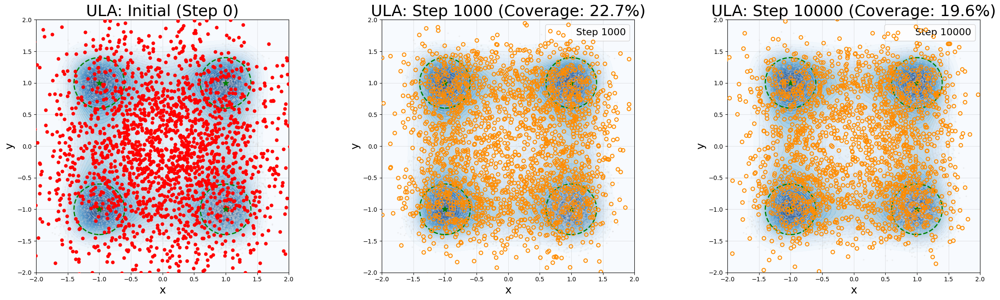

ULA Coverage: Step 1000=22.70%, Step 10000=19.65%



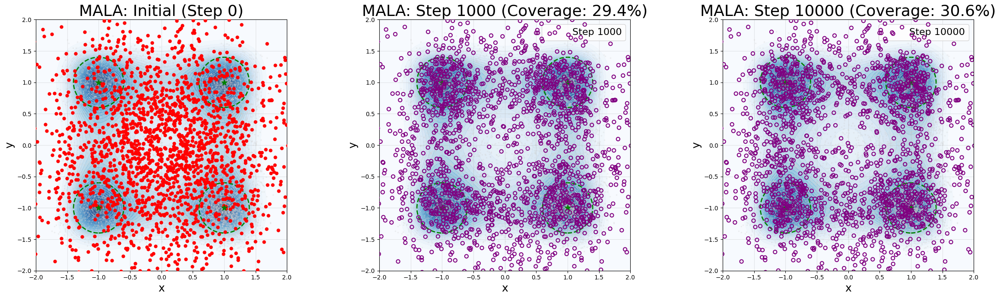

MALA Coverage: Step 1000=29.35%, Step 10000=30.65%



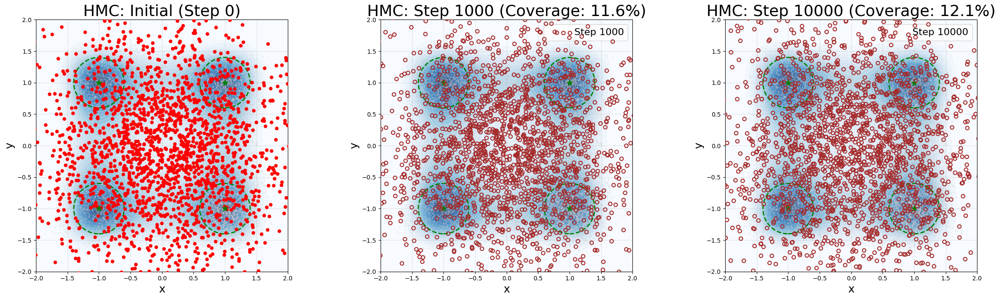

HMC Coverage: Step 1000=11.55%, Step 10000=12.10%



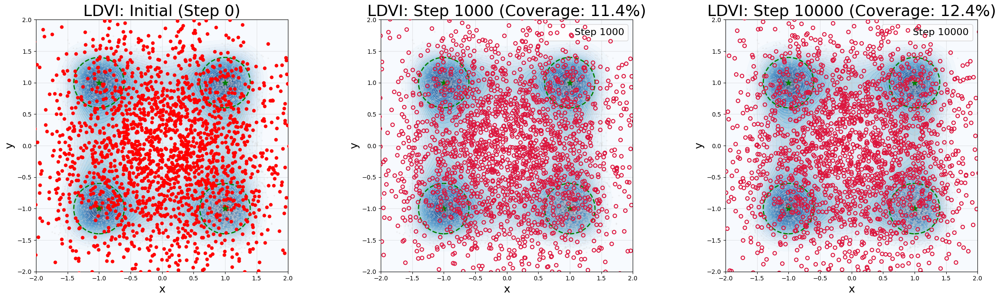

LDVI Coverage: Step 1000=11.45%, Step 10000=12.45%



In [31]:
# ============================================================
# Particle Evolution Plots for Baseline Methods (cell 29 style)
# Each method: 1x3 subplots (step 0, step 1000, final)
# ============================================================

from matplotlib.patches import Circle

baseline_colors = {
    'ULA': 'darkorange', 'MALA': 'purple', 'HMC': 'brown',
    'LDVI': 'crimson'
}

for method_name, res in baseline_results.items():
    traj = res['traj']  # (n_particles, dim, n_iter+1)
    metrics = res['metrics']
    mc = baseline_colors.get(method_name, 'blue')

    # Calculate coverage at step 1000
    p1k = traj[:, :, 1000]
    dtw = np.min(np.linalg.norm(p1k[:, np.newaxis, :] - well_centers[np.newaxis, :, :], axis=2), axis=1)
    cov1k = 100.0 * np.sum(dtw <= well_radius) / len(p1k)

    fig, axes = plt.subplots(1, 3, figsize=(24, 7))

    # Step 0
    ax = axes[0]
    ax.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
    ax.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2)
    ax.scatter(traj[:, 0, 0], traj[:, 1, 0], s=25, c='red', marker='o', label='Initial', zorder=5)
    for c in well_centers:
        ax.add_patch(Circle(c, well_radius, fill=False, edgecolor='green', linewidth=2, linestyle='--'))
    ax.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', marker='*', zorder=10)
    ax.set_xlabel('x', fontsize=18); ax.set_ylabel('y', fontsize=18)
    ax.set_title(f'{method_name}: Initial (Step 0)', fontsize=26)
    ax.set_xlim(-2, 2); ax.set_ylim(-2, 2); ax.set_aspect('equal'); ax.grid(True, alpha=0.3)

    # Step 1000
    ax = axes[1]
    ax.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
    ax.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2)
    ax.scatter(traj[:, 0, 1000], traj[:, 1, 1000], s=35, facecolors='none',
               edgecolors=mc, linewidth=1.5, label='Step 1000', zorder=15)
    for c in well_centers:
        ax.add_patch(Circle(c, well_radius, fill=False, edgecolor='green', linewidth=2, linestyle='--'))
    ax.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', marker='*', zorder=10)
    ax.set_xlabel('x', fontsize=18); ax.set_ylabel('y', fontsize=18)
    ax.set_title(f'{method_name}: Step 1000 (Coverage: {cov1k:.1f}%)', fontsize=26)
    ax.set_xlim(-2, 2); ax.set_ylim(-2, 2); ax.set_aspect('equal')
    ax.legend(loc='upper right', fontsize=16); ax.grid(True, alpha=0.3)

    # Final step
    ax = axes[2]
    ax.contourf(X_grid, Y_grid, density_grid, levels=30, cmap='Blues', alpha=0.7)
    ax.scatter(X_tar[:, 0], X_tar[:, 1], s=3, c='lightgray', alpha=0.2)
    ax.scatter(traj[:, 0, n_iter_kswgd], traj[:, 1, n_iter_kswgd], s=35, facecolors='none',
               edgecolors=mc, linewidth=1.5, label=f'Step {n_iter_kswgd}', zorder=15)
    for c in well_centers:
        ax.add_patch(Circle(c, well_radius, fill=False, edgecolor='green', linewidth=2, linestyle='--'))
    ax.scatter(well_centers[:, 0], well_centers[:, 1], s=100, c='green', marker='*', zorder=10)
    ax.set_xlabel('x', fontsize=18); ax.set_ylabel('y', fontsize=18)
    final_cov = metrics['well_coverage'][-1]
    ax.set_title(f'{method_name}: Step {n_iter_kswgd} (Coverage: {final_cov:.1f}%)', fontsize=26)
    ax.set_xlim(-2, 2); ax.set_ylim(-2, 2); ax.set_aspect('equal')
    ax.legend(loc='upper right', fontsize=16); ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()
    print(f"{method_name} Coverage: Step 1000={cov1k:.2f}%, Step {n_iter_kswgd}={final_cov:.2f}%\n")

Computing KDE densities for all methods...
  ULA done
  MALA done
  HMC done
  LDVI done


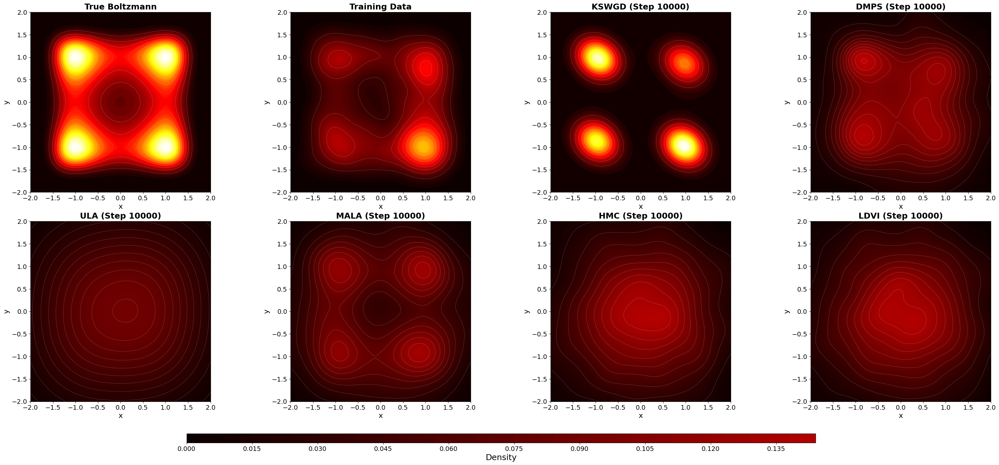


Density max values:
        True Boltzmann: max=0.2575, mean=0.0615
         Training Data: max=0.3763, mean=0.0612
                 KSWGD: max=0.5743, mean=0.0594
                  DMPS: max=0.1514, mean=0.0568
                   ULA: max=0.0894, mean=0.0456
                  MALA: max=0.1314, mean=0.0545
                   HMC: max=0.1451, mean=0.0561
                  LDVI: max=0.1423, mean=0.0562


In [32]:
# ============================================================
# Density Heat Map Comparison: ALL methods (cell 32 style)
# ============================================================

from scipy.stats import gaussian_kde

n_grid_kde_all = 100
x_ev = np.linspace(-2, 2, n_grid_kde_all)
y_ev = np.linspace(-2, 2, n_grid_kde_all)
X_ev, Y_ev = np.meshgrid(x_ev, y_ev)
pos_ev = np.vstack([X_ev.ravel(), Y_ev.ravel()])

def safe_kde(particles, pos, n_grid):
    """Compute KDE density, handling degenerate cases."""
    # Filter out NaN/Inf particles
    valid = np.isfinite(particles).all(axis=1)
    particles = particles[valid]
    if particles.shape[0] < 2 or np.std(particles) < 1e-6:
        return np.ones((n_grid, n_grid)) * 0.01
    try:
        kde = gaussian_kde(particles.T, bw_method='scott')
        return kde(pos).reshape(n_grid, n_grid)
    except np.linalg.LinAlgError:
        p_noisy = particles + np.random.randn(*particles.shape) * 1e-4
        kde = gaussian_kde(p_noisy.T, bw_method='scott')
        return kde(pos).reshape(n_grid, n_grid)

# Compute all densities
print("Computing KDE densities for all methods...")
density_all = {}
density_all['True Boltzmann'] = potential.stationary_density(X_ev, Y_ev)
density_all['Training Data'] = safe_kde(X_tar, pos_ev, n_grid_kde_all)
density_all['KSWGD'] = safe_kde(X_kswgd_traj_sdmd[:, :, n_iter_kswgd], pos_ev, n_grid_kde_all)
density_all['DMPS'] = safe_kde(X_kswgd_traj_dm[:, :, n_iter_kswgd], pos_ev, n_grid_kde_all)
for mname in baseline_results:
    density_all[mname] = safe_kde(baseline_results[mname]['traj'][:, :, n_iter_kswgd], pos_ev, n_grid_kde_all)
    print(f"  {mname} done")

# Build plot order dynamically
baseline_names = list(baseline_results.keys())
plot_order = ['True Boltzmann', 'Training Data', 'KSWGD', 'DMPS'] + baseline_names
n_plots = len(plot_order)
n_cols = 4
n_rows = (n_plots + n_cols - 1) // n_cols

# Common colorbar range (excluding Boltzmann)
kde_keys = [k for k in plot_order if k != 'True Boltzmann']
vmax_all = max(density_all[k].max() for k in kde_keys)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(8 * n_cols, 7 * n_rows))
axes_flat = axes.flatten()

for i, name in enumerate(plot_order):
    ax = axes_flat[i]
    d = density_all[name]
    if name == 'True Boltzmann':
        im = ax.contourf(X_ev, Y_ev, d, levels=50, cmap='hot')
    else:
        im = ax.contourf(X_ev, Y_ev, d, levels=50, cmap='hot', vmin=0, vmax=vmax_all)
    ax.contour(X_ev, Y_ev, d, levels=10, colors='white', alpha=0.3, linewidths=0.5)
    ax.set_xlabel('x', fontsize=16)
    ax.set_ylabel('y', fontsize=16)
    title = name if name in ['True Boltzmann', 'Training Data'] else f'{name} (Step {n_iter_kswgd})'
    ax.set_title(title, fontsize=18, fontweight='bold')
    ax.set_xlim(-2, 2); ax.set_ylim(-2, 2); ax.set_aspect('equal')
    ax.tick_params(axis='both', labelsize=14)

# Hide unused subplots
for j in range(n_plots, len(axes_flat)):
    axes_flat[j].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(bottom=0.12)
cbar_ax = fig.add_axes([0.2, 0.03, 0.6, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Density', fontsize=18)
cbar.ax.tick_params(labelsize=14)
plt.show()

print("\nDensity max values:")
for name in plot_order:
    print(f"  {name:>20s}: max={density_all[name].max():.4f}, mean={density_all[name].mean():.4f}")

Computing KL Divergence for ALL methods...

ULA:
  Step 0: KL = 0.6871
  Step 2000: KL = 0.5307
  Step 4000: KL = 0.6244
  Step 6000: KL = 0.6827
  Step 8000: KL = 0.7672
  Step 10000: KL = 0.8124

MALA:
  Step 0: KL = 0.6871
  Step 2000: KL = 0.5672
  Step 4000: KL = 0.5699
  Step 6000: KL = 0.5689
  Step 8000: KL = 0.5575
  Step 10000: KL = 0.5613

HMC:
  Step 0: KL = 0.6871
  Step 2000: KL = 0.6834
  Step 4000: KL = 0.6825
  Step 6000: KL = 0.6768
  Step 8000: KL = 0.6762
  Step 10000: KL = 0.6688

LDVI:
  Step 0: KL = 0.6871
  Step 2000: KL = 0.6800
  Step 4000: KL = 0.6748
  Step 6000: KL = 0.6734
  Step 8000: KL = 0.6678
  Step 10000: KL = 0.6651


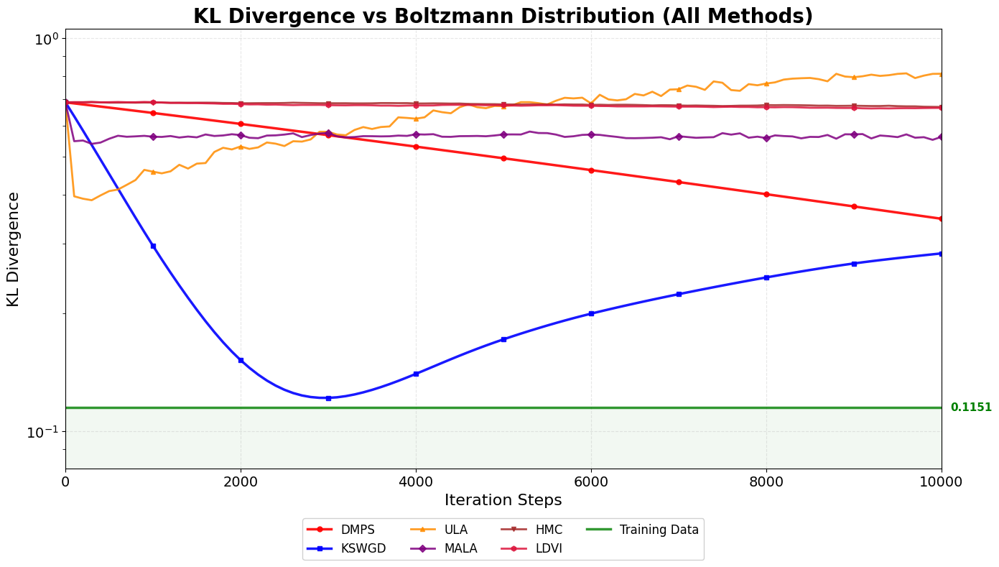


Method                 Initial KL     Final KL   KL Reduction   Final Coverage
Training Data              0.1151       0.1151     (baseline)              N/A
DMPS                       0.6871       0.3475         0.3396            25.4%
KSWGD                      0.6871       0.2837         0.4034            93.3%
ULA                        0.6871       0.8124        -0.1253            19.6%
MALA                       0.6871       0.5613         0.1258            30.6%
HMC                        0.6871       0.6688         0.0183            12.1%
LDVI                       0.6871       0.6651         0.0220            12.4%


In [33]:
# ============================================================
# KL Divergence Comparison: ALL methods (cell 36 style)
# ============================================================

from matplotlib.ticker import LogLocator

print("="*60)
print("Computing KL Divergence for ALL methods...")
print("="*60)

eval_steps_all = list(range(0, n_iter_kswgd + 1, 100))

# KL for baseline methods
kl_baselines = {}
for mname, res in baseline_results.items():
    traj = res['traj']
    kl_list = []
    print(f"\n{mname}:")
    for t in eval_steps_all:
        pts = traj[:, :, t]
        kl_val = compute_kl_divergence_kde(pts, potential)
        kl_list.append(kl_val)
        if t % 2000 == 0:
            print(f"  Step {t}: KL = {kl_val:.4f}")
    kl_baselines[mname] = kl_list

# ============================================================
# Plot: KL Divergence for ALL methods
# ============================================================
fig, ax = plt.subplots(figsize=(14, 8))

# DMPS and KSWGD (already computed in cell 36)
ax.plot(eval_steps_all, kl_history_dm, 'r-o', linewidth=2.5, markersize=5,
        markevery=10, label='DMPS', alpha=0.9)
ax.plot(eval_steps_all, kl_history_sdmd, 'b-s', linewidth=2.5, markersize=5,
        markevery=10, label='KSWGD', alpha=0.9)

# Baseline methods
style_map = {
    'ULA':         ('darkorange', '-', '^'),
    'MALA':        ('purple',     '-', 'D'),
    'HMC':         ('brown',      '-', 'v'),
    'LDVI':        ('crimson',    '-', 'h'),
}
for mname, kl_list in kl_baselines.items():
    color, ls, marker = style_map[mname]
    ax.plot(eval_steps_all, kl_list, color=color, linestyle=ls, marker=marker,
            linewidth=2.0, markersize=5, markevery=10, label=mname, alpha=0.85)

# Training data baseline
ax.axhline(y=kl_training_data, color='green', linestyle='-', linewidth=2.5,
           label='Training Data', alpha=0.8)
ax.fill_between(eval_steps_all, 0, kl_training_data, color='green', alpha=0.05)

ax.set_xlabel('Iteration Steps', fontsize=16)
ax.set_ylabel('KL Divergence', fontsize=16)
ax.set_title('KL Divergence vs Boltzmann Distribution (All Methods)', fontsize=20, fontweight='bold')
ax.set_xlim(0, n_iter_kswgd)
ax.set_yscale('log')
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend(fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.1),
          ncol=4, framealpha=0.9, fancybox=True)

# Y-axis formatting
all_kl = kl_history_dm + kl_history_sdmd
for v in kl_baselines.values():
    all_kl += v
ymin = min(min(all_kl), kl_training_data) * 0.7
ymax = max(all_kl) * 1.3
ax.set_ylim(ymin, ymax)
ax.yaxis.set_major_locator(LogLocator(base=10.0, numticks=12))
ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10) * 0.1, numticks=10))
ax.tick_params(axis='both', labelsize=14)
ax.tick_params(axis='y', which='minor', length=3)

# Training data annotation
ax.annotate(f'{kl_training_data:.4f}', xy=(n_iter_kswgd, kl_training_data),
            xytext=(n_iter_kswgd * 1.01, kl_training_data),
            fontsize=11, color='green', fontweight='bold', va='center', ha='left',
            annotation_clip=False)

plt.tight_layout()
plt.show()

# Summary table
print("\n" + "="*90)
print(f"{'Method':<20} {'Initial KL':>12} {'Final KL':>12} {'KL Reduction':>14} {'Final Coverage':>16}")
print("="*90)
print(f"{'Training Data':<20} {kl_training_data:>12.4f} {kl_training_data:>12.4f} {'(baseline)':>14} {'N/A':>16}")
print(f"{'DMPS':<20} {kl_history_dm[0]:>12.4f} {kl_history_dm[-1]:>12.4f} {kl_history_dm[0]-kl_history_dm[-1]:>14.4f} {metrics_dm['well_coverage'][-1]:>15.1f}%")
print(f"{'KSWGD':<20} {kl_history_sdmd[0]:>12.4f} {kl_history_sdmd[-1]:>12.4f} {kl_history_sdmd[0]-kl_history_sdmd[-1]:>14.4f} {metrics_sdmd['well_coverage'][-1]:>15.1f}%")
for mname in baseline_results.keys():
    kl = kl_baselines[mname]
    cov = baseline_results[mname]['metrics']['well_coverage'][-1]
    print(f"{mname:<20} {kl[0]:>12.4f} {kl[-1]:>12.4f} {kl[0]-kl[-1]:>14.4f} {cov:>15.1f}%")
print("="*90)